In [1]:
import joblib
import dice_ml
import shap
import lime
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from operator import itemgetter
from sklearn.model_selection import train_test_split, cross_val_score
from explainerdashboard import ClassifierExplainer
from sklearn.metrics import ConfusionMatrixDisplay, precision_recall_fscore_support, classification_report
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from alibi.explainers.ale import ALE, plot_ale

DEBUG:matplotlib:CONFIGDIR=/Users/juanan/.matplotlib
DEBUG:matplotlib:(private) matplotlib data path: /Users/juanan/software/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data
DEBUG:matplotlib:matplotlib data path: /Users/juanan/software/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data
DEBUG:matplotlib:loaded rc file /Users/juanan/software/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data/matplotlibrc
DEBUG:matplotlib:matplotlib version 3.2.2
DEBUG:matplotlib:interactive is False
DEBUG:matplotlib:platform is darwin
DEBUG:matplotlib:loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_warnings', '_frozen_importlib_external', '_io', 'marshal', 'posix', '_thread', '_weakref', 'time', 'zipimport', '_codecs', 'codecs', 'encodings.aliases', 'encodings', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', '_abc', 'abc', 'io', '_stat', 'stat', '_collections_abc', 'genericpath', 'posixpath', 'os.path', 'os', '_sitebuiltins', '_locale', '_bootloca

DEBUG:matplotlib:CACHEDIR=/Users/juanan/.matplotlib
DEBUG:matplotlib.font_manager:Using fontManager instance from /Users/juanan/.matplotlib/fontlist-v310.json
DEBUG:matplotlib.pyplot:Loaded backend module://ipykernel.pylab.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://ipykernel.pylab.backend_inline version unknown.
DEBUG:graphviz._tools:deprecate positional args: graphviz.backend.piping.pipe(['renderer', 'formatter', 'neato_no_op', 'quiet'])
DEBUG:graphviz._tools:deprecate positional args: graphviz.backend.rendering.render(['renderer', 'formatter', 'neato_no_op', 'quiet'])
DEBUG:graphviz._tools:deprecate positional args: graphviz.backend.unflattening.unflatten(['stagger', 'fanout', 'chain', 'encoding'])
DEBUG:graphviz._tools:deprecate positional args: graphviz.backend.viewing.view(['quiet'])
DEBUG:graphviz._tools:deprecate positional args: graphviz.quoting.quote(['is_html_string', 'is_valid_id', 'dot_keywords', 'endswith_odd_number_of_backslashes', 'es

Level 1:tensorflow:Registering model_variables ((<class 'tensorflow.core.framework.variable_pb2.VariableDef'>, <function _to_proto_fn at 0x7fdd933203a0>, <function _from_proto_fn at 0x7fdd933204c0>)) in proto functions.
Level 1:tensorflow:Registering global_step ((<class 'tensorflow.core.framework.variable_pb2.VariableDef'>, <function _to_proto_fn at 0x7fdd933203a0>, <function _from_proto_fn at 0x7fdd933204c0>)) in proto functions.
Level 1:tensorflow:Registering metric_variables ((<class 'tensorflow.core.framework.variable_pb2.VariableDef'>, <function _to_proto_fn at 0x7fdd933203a0>, <function _from_proto_fn at 0x7fdd933204c0>)) in proto functions.
Level 1:tensorflow:Registering Assert (None) in gradient.
Level 1:tensorflow:Registering VarIsInitializedOp (None) in gradient.
Level 1:tensorflow:Registering VariableShape (None) in gradient.
Level 1:tensorflow:Registering StatelessMultinomial (None) in gradient.
Level 1:tensorflow:Registering StatelessRandomBinomial (None) in gradient.
Lev

Level 1:tensorflow:Registering DepthwiseConv2dNativeBackpropFilter (<function _DepthwiseConv2dNativeBackpropFilterGrad at 0x7fdd73d168b0>) in gradient.
Level 1:tensorflow:Registering Conv3D (<function _Conv3DGrad at 0x7fdd73d16f70>) in gradient.
Level 1:tensorflow:Registering Conv3DBackpropInputV2 (<function _Conv3DBackpropInputGrad at 0x7fdd73d16d30>) in gradient.
Level 1:tensorflow:Registering Conv3DBackpropFilterV2 (<function _Conv3DBackpropFilterGrad at 0x7fdd73d10040>) in gradient.
Level 1:tensorflow:Registering AvgPool3D (<function _AvgPool3DGrad at 0x7fdd73d16ee0>) in gradient.
Level 1:tensorflow:Registering AvgPool3DGrad (<function _AvgPool3DGradGrad at 0x7fdd73d10280>) in gradient.
Level 1:tensorflow:Registering MaxPool3D (<function _MaxPool3DGrad at 0x7fdd73d100d0>) in gradient.
Level 1:tensorflow:Registering MaxPool3DGrad (<function _MaxPool3DGradGrad at 0x7fdd73d16dc0>) in gradient.
Level 1:tensorflow:Registering MaxPool3DGradGrad (<function _MaxPool3DGradGradGrad at 0x7fdd

Level 1:tensorflow:Registering LeftShift (None) in gradient.
Level 1:tensorflow:Registering RightShift (None) in gradient.
Level 1:tensorflow:Registering XlaVariadicReduce (None) in gradient.
Level 1:tensorflow:Registering XlaSharding (<function _sharding_grad at 0x7fdd73f11430>) in gradient.
Level 1:tensorflow:Registering XlaSpmdFullToShardShape (<function _spmd_full_to_shard_shape_grad at 0x7fdd73f114c0>) in gradient.
Level 1:tensorflow:Registering XlaSpmdShardToFullShape (<function _spmd_shard_to_full_shape_grad at 0x7fdd73f099d0>) in gradient.
Level 1:tensorflow:Registering XlaClusterOutput (<function _XlaClusterOutputGrad at 0x7fdd73f34d30>) in gradient.
Level 1:tensorflow:Registering TPUReplicatedInput (None) in gradient.
Level 1:tensorflow:Registering tpu_replicated_input_resolver (<function tpu_replicated_input_resolver at 0x7fdd73ff5a60>) in acd_resource_resolvers.
Level 1:tensorflow:Registering Pack (<function _PackGrad at 0x7fdd740c64c0>) in gradient.
Level 1:tensorflow:Regi

Level 1:tensorflow:Registering TensorScatterMin (<function _TensorScatterMinGrad at 0x7fdd740f3550>) in gradient.
Level 1:tensorflow:Registering TensorScatterSub (<function _TensorScatterSubGrad at 0x7fdd740f3c10>) in gradient.
Level 1:tensorflow:Registering ScatterNdNonAliasingAdd (<function _ScatterNdNonAliasingAddGrad at 0x7fdd740f3d30>) in gradient.
Level 1:tensorflow:Registering BroadcastTo (<function _BroadcastToGrad at 0x7fdd740f3dc0>) in gradient.
Level 1:tensorflow:Registering Switch (<function _SwitchGrad at 0x7fdd740f3ca0>) in gradient.
Level 1:tensorflow:Registering RefSwitch (<function _SwitchGrad at 0x7fdd740f3ca0>) in gradient.
Level 1:tensorflow:Registering Merge (<function _MergeGrad at 0x7fdd74304160>) in gradient.
Level 1:tensorflow:Registering RefMerge (<function _RefMergeGrad at 0x7fdd740f3f70>) in gradient.
Level 1:tensorflow:Registering Exit (<function _ExitGrad at 0x7fdd74304280>) in gradient.
Level 1:tensorflow:Registering RefExit (<function _ExitGrad at 0x7fdd

Level 1:tensorflow:Registering Sinh (<function _SinhGrad at 0x7fdd74397dc0>) in gradient.
Level 1:tensorflow:Registering Cosh (<function _CoshGrad at 0x7fdd7439c1f0>) in gradient.
Level 1:tensorflow:Registering Tanh (<function _TanhGrad at 0x7fdd74397d30>) in gradient.
Level 1:tensorflow:Registering Asinh (<function _AsinhGrad at 0x7fdd74397ca0>) in gradient.
Level 1:tensorflow:Registering Acosh (<function _AcoshGrad at 0x7fdd7439c160>) in gradient.
Level 1:tensorflow:Registering Atanh (<function _AtanhGrad at 0x7fdd7439c310>) in gradient.
Level 1:tensorflow:Registering TanhGrad (<function _TanhGradGrad at 0x7fdd7439c040>) in gradient.
Level 1:tensorflow:Registering Erf (<function _ErfGrad at 0x7fdd7439c0d0>) in gradient.
Level 1:tensorflow:Registering Erfc (<function _ErfcGrad at 0x7fdd7439c430>) in gradient.
Level 1:tensorflow:Registering Erfinv (<function _ErfinvGrad at 0x7fdd7439c280>) in gradient.
Level 1:tensorflow:Registering Ndtri (<function _NdtriGrad at 0x7fdd7439c550>) in gr

Level 1:tensorflow:Registering Cross (<function _CrossGrad at 0x7fdd743acd30>) in gradient.
Level 1:tensorflow:Registering Cumsum (<function _CumsumGrad at 0x7fdd743acf70>) in gradient.
Level 1:tensorflow:Registering Cumprod (<function _CumprodGrad at 0x7fdd743acdc0>) in gradient.
Level 1:tensorflow:Registering CumulativeLogsumexp (<function _CumulativeLogsumexpGrad at 0x7fdd743b20d0>) in gradient.
Level 1:tensorflow:Registering NextAfter (<function _NextAfterGrad at 0x7fdd743b2040>) in gradient.
Level 1:tensorflow:Registering OptionalFromValue (<function _OptionalFromValueGrad at 0x7fdd743b2160>) in gradient.
Level 1:tensorflow:Registering OptionalGetValue (<function _OptionalGetValueGrad at 0x7fdd743acca0>) in gradient.
Level 1:tensorflow:Registering RandomGamma (<function _RandomGammaGrad at 0x7fdd743b2550>) in gradient.
Level 1:tensorflow:Registering StatelessRandomGammaV2 (<function _StatelessRandomGammaV2Grad at 0x7fdd743b2820>) in gradient.
Level 1:tensorflow:Registering Statele

Level 1:tensorflow:Registering SparseToDense (<function _SparseToDenseGrad at 0x7fdd74e88e50>) in gradient.
Level 1:tensorflow:Registering Assign (None) in gradient.
Level 1:tensorflow:Registering AssignAdd (None) in gradient.
Level 1:tensorflow:Registering AssignSub (None) in gradient.
Level 1:tensorflow:Registering ScatterAdd (None) in gradient.
Level 1:tensorflow:Registering ScatterSub (None) in gradient.
Level 1:tensorflow:Registering ScatterMul (None) in gradient.
Level 1:tensorflow:Registering ScatterDiv (None) in gradient.
Level 1:tensorflow:Registering ScatterNdUpdate (None) in gradient.
Level 1:tensorflow:Registering ScatterNdAdd (None) in gradient.
Level 1:tensorflow:Registering ScatterNdSub (None) in gradient.
Level 1:tensorflow:Registering ScatterNdMul (None) in gradient.
Level 1:tensorflow:Registering ScatterNdDiv (None) in gradient.
Level 1:tensorflow:Registering DecodeProtoV2 (None) in gradient.
Level 1:tensorflow:Registering EncodeProto (None) in gradient.
Level 1:tenso

Level 1:tensorflow:Registering AvgPoolGrad,flops (<function _avg_pool_grad_flops at 0x7fdd753f2dc0>) in statistical functions.
Level 1:tensorflow:Registering MaxPoolGrad,flops (<function _max_pool_grad_flops at 0x7fdd753f2f70>) in statistical functions.
Level 1:tensorflow:Registering Conv2DBackpropInput,flops (<function _conv_2d_backprop_input_flops at 0x7fdd753f2c10>) in statistical functions.
Level 1:tensorflow:Registering Conv2DBackpropFilter,flops (<function _conv_2d_backprop_filter_flops at 0x7fdd753f70d0>) in statistical functions.
Level 1:tensorflow:Registering AddN,flops (<function _add_n_flops at 0x7fdd753f2ee0>) in statistical functions.
Level 1:tensorflow:Registering SdcaFprint (None) in gradient.
Level 1:tensorflow:Registering SdcaOptimizer (None) in gradient.
Level 1:tensorflow:Registering SdcaOptimizerV2 (None) in gradient.
Level 1:tensorflow:Registering SdcaShrinkL1 (None) in gradient.
Level 1:tensorflow:Registering GenerateVocabRemapping (None) in gradient.
Level 1:tens

In [6]:
class IREX:
    def __init__(self):
        ## The names of the explanation methods used are defined.
        self.name_methods = ["Importance", "LIME", "SHAP", "ALE"]
        ## The number of iterations performed in the explanation is defined.
        ## The class names present in the dataset to be plotted are defined.
        self.list_color = ['gray', 'black', 'red']
        self.iteration = 0
##ANN methods
    def set_source_dataset(self, main_dataset, target_classes):
        self.path_dataset=main_dataset
        self.path_dataset_qs="Question_Status.csv"
        self.path_dataset_qd="Global_Process_Data.csv"
        self.target_names = target_classes
        self.name_class = [name1+" class", name2+" class", name3+" class"] #ARREGLAR
        
    def set_expected_answers(self, source, negative_class, positive_class):
        self.path_dataset_qa=source
        self.negative_class = negative_class_input
        self.positive_class = positive_class_input
        self.selection_class = [self.negative_class, self.positive_class]
        
    def reset(self):
        self.iteration = 1
        
        ## Loading data from the dataset.
        self.df = pd.read_csv(self.path_dataset)

        ## Assignment of local variables according to the data necessary for the neural network.
        self.train_cols = self.df.columns [0:-1]
        self.label = self.df.columns [-1]
        self.X = self.df [self.train_cols]
        self.y = self.df [self.label]

        ## Generation of the question status list automatically.
        question = list(range(1, self.df.shape[1]))
        status = ['In use' for _ in range(1, self.df.shape[1])]
        self.ds = pd.DataFrame({'Question': question, 'Status': status})

        ## Save the changed statuses in the dataset.
        self.ds.to_csv(self.path_dataset_qs, index = False)

        ## Generation of the data structure by iteration automatically.
        columns = ['Question', 'Acurracy global']

        for index in range(0, len(self.name_class)):
            columns.append('Precision_' + str(index))
            columns.append('Recall_' + str(index))
            columns.append('F1_score_' + str(index))
            columns.append('Support_' + str(index))

        self.dd = pd.DataFrame(columns = columns)

        ## Save the changed data in the dataset.
        self.dd.to_csv(self.path_dataset_qd, index = False)


    def iterate(self):
        self.iteration += 1
        
        if(self.iteration>=2):
            ## Loading data from the dataset.
            self.ds = pd.read_csv(self.path_dataset_qs)
            self.df = pd.read_csv(self.path_dataset)
            
            i = 0
            ## Elimination of the list of anomadic items defined in the improvement process.
            self.ds_delete = self.ds[self.ds.Status == "Delete"].reset_index(drop=True)
            for x in self.ds_delete['Question'].tolist():
                self.df.drop(self.df.columns[x - (i + 1)], axis = 1, inplace = True)
                i += 1
            
            ## Assignment of local variables according to the data necessary for the neural network.
            self.train_cols = self.df.columns [0:-1]
            self.label = self.df.columns [-1]
            self.X = self.df [self.train_cols]
            self.y = self.df [self.label]
        else:
            print("Error. Reset first")
    
    
    def train_model(self, do_oversample= True, optimize = False, saveModel = True):
        self.seed = 1
        
        hidden_layer = max(int(self.df.columns / 2),10)
        
        if(do_oversample):
            self._oversample()
            
        if(optimize): #finds optimal model and stores it in self.mlp
            _optmize_model()
        else: #Use default parameters
            self.mlp = MLPClassifier(hidden_layer_sizes = (hidden_layer,), random_state = 77)

        self.mlp.fit(self.X_train, self.y_train)

            
        if(saveModel):
            joblib.dump(self.mlp,"model_depression_i" + str(self.iteration) + ".pkl")

     
    def _oversample(self):
        ## The oversample function used is defined.
        random_state = 13
        oversample = SMOTE(random_state = random_state)
        self.X, self.y = oversample.fit_resample(self.X, self.y)

    def _optimize_model(self):
        print("Optimizing... (may take a long while)")
        GRID = {
             'activation' : ['relu','tanh','logistic'],
             'solver': ['lbfgs', 'sgd', 'adam'],
             'hidden_layer_sizes' : [(40,),(50,),(60,),(70,),(100,)],
             'max_iter' : [100000]
             }

        model = MLPClassifier(random_state = 12)
        clf = GridSearchCV(model, GRID, n_jobs=-1,  verbose=2)
        self.mlp = clf.best_estimator_
            

##Explanation methods  
    def evaluate_model(self):
        ## The data for the generation of the confession matrix are defined.
        confusion_matrix = ConfusionMatrixDisplay.from_estimator(self.mlp, self.X_test, self.y_test, display_labels = self.target_names,
                                                         cmap = plt.cm.Blues)
        confusion_matrix.ax_.set_title("Confusion Matrix")
        plt.show()
        
        self.y_pred = self.mlp.predict(self.X_test)
        print('Classification accuracy =',accuracy_score(self.y_test,self.y_pred) * 100,'%\n')
        print(classification_report(self.y_test,self.y_pred))
        
        accuracy = accuracy_score(self.y_test,self.y_pred) * 100
        clf_rep = precision_recall_fscore_support(self.y_test,self.y_pred)

        ## The number of items used in the iteration is retrieved.
        self.ds_delete = self.ds[self.ds.Status == "Delete"]
        self.ds_delete.reset_index(inplace=True, drop=True)
            
        ## All the metrics of the confusion matrix are obtained.
        self.metrics = [",".join(map(str, self.ds_delete['Question'].tolist())),
                   accuracy]

        for index in range(0, len(self.name_class)):
            self.metrics.append(clf_rep[0][index])
            self.metrics.append(clf_rep[1][index])
            self.metrics.append(clf_rep[2][index])
            self.metrics.append(clf_rep[3][index])

        ## The names of the columns of the dataset are defined.
        columns = ['Question', 'Acurracy global']

        for index in range(0, len(self.name_class)):
            columns.append('Precision_' + str(index))
            columns.append('Recall_' + str(index))
            columns.append('F1_score_' + str(index))
            columns.append('Support_' + str(index))

        ## A new row of the dataset is generated with all the data.
        self.data_metrics = pd.DataFrame([self.metrics], columns = columns)
        
        if(self.iteration==1):
            self.data_metrics.at[0,"Question"] = 0
        
        ## The data is saved to the dataset.
        self.data_metrics.to_csv(self.path_dataset_qd, mode = 'a', header = False, index = False)

        ## The data added to the dataset is printed.
        self.data_metrics
        
    def run_ALE(self):
        ##In analysis of the model through the results obtained by ALE, it is possible to identify the behavior
        ##of the neural network.
        ## The necessary parameters for the use of ALE are established according to the model.
        proba_fun_lr = self.mlp.predict_proba
        proba_ale_lr = ALE(proba_fun_lr, feature_names = self.train_cols, target_names = self.target_names)
        proba_exp_lr = proba_ale_lr.explain(self.X_train.to_numpy())
        plot_ale(proba_exp_lr, n_cols=2, features=list(range(self.df.shape[1]-1)),fig_kw={'figwidth': 10, 'figheight': 180});
        
        ## The question metrics dataset is loaded.
        self.dm = pd.DataFrame()
        
        ## The number of items used in the iteration is retrieved.
        ds_item = self.ds[self.ds.Status == "In use"]
        ds_item.reset_index(inplace=True, drop=True)
        
        ## We get the slopes from the ALE data.
        for i in range(self.df.shape[1]-1):
            structure_data = {'Question': ds_item.loc[i, "Question"]}

            for index in self.selection_class:
                slope = proba_exp_lr.ale_values [i][1][index] - proba_exp_lr.ale_values [i][0][index]
                structure_data['Slope ' + str(self.target_names[index])] = slope
                structure_data['Threshold ' + str(self.target_names[index])] = 'NA'
                structure_data['Anomaly ' + str(self.target_names[index])] = 'NA'

            self.dm = self.dm.append(structure_data, ignore_index=True)

        ## The current rating data dataset is printed.
        
    def apply_Threshold(self, positive, negative):
        ## Positive and negative threshold values are defined for the slope qualification process.
        self.positive_threshold = positive
        self.negative_threshold = negative
        for i in range(self.df.shape[1]-1):
            for index in self.selection_class:

                ## The slopes are selected according to the values of the thresholds of the defined classes.
                if self.dm.loc[i, "Slope " + str(self.target_names[index])] >= self.positive_threshold:
                    self.dm.loc[i, "Threshold " + str(self.target_names[index])] = 1
                elif self.dm.loc[i, "Slope " + str(self.target_names[index])] <= self.negative_threshold:
                    self.dm.loc[i, "Threshold " + str(self.target_names[index])] = 0

        ## The current rating data dataset is printed.
        self.dm
    def search_PAI(self, mode):
        ## The dataset of expected responses is loaded.
        expected_response_map = [[0, 1, 0, 1], [1, 0, 1, 0]]
        self.da = pd.read_csv(self.path_dataset_qa)

        ## Delete list of items deleted in this iteration.
        i = 0
        for x in self.ds_delete['Question']:
            self.da.drop(self.da.index[x - (i + 1)], axis = 0, inplace = True)
            i += 1

        ## Indexes are restored for later use.
        self.da.reset_index(inplace=True, drop=True)

        ## The dataset of expected responses is printed.
        self.da
        for i in range(self.df.shape[1]-1):
            ## Local variable to indicate the index of the selected classes.
            i_index = 0

            for index in self.selection_class:

                ## Determine if it fails based on the expected response parameters of the defined classes.
                if self.dm.loc[i, "Threshold "  + str(self.target_names[index])] == 1 and self.da.loc[i, "RE"] == 0:
                    self.dm.loc[i, "Anomaly " + str(self.target_names[index])] = expected_response_map[i_index][0]
                if self.dm.loc[i, "Threshold " + str(self.target_names[index])] == 1 and self.da.loc[i, "RE"] == 1:
                    self.dm.loc[i, "Anomaly " + str(self.target_names[index])] = expected_response_map[i_index][1]
                if self.dm.loc[i, "Threshold " + str(self.target_names[index])] == 0 and self.da.loc[i, "RE"] == 1:
                    self.dm.loc[i, "Anomaly " + str(self.target_names[index])] = expected_response_map[i_index][2]
                if self.dm.loc[i, "Threshold " + str(self.target_names[index])] == 0 and self.da.loc[i, "RE"] == 0:
                    self.dm.loc[i, "Anomaly "  + str(self.target_names[index])] = expected_response_map[i_index][3]

                ## Increase of the index of the selected classes.
                i_index += 1

        ## The final grade data dataset is printed.
        self.dm
        
        ## Local variable for the elimination of the anomaly items.
        instructions = ''
        init = False
        self.question_anomaly = []
        selection_mode = mode

        if selection_mode == 1: ##POSITIVE CLASS

            ## Items that fail in the defined class are retrieved.
            self.dm_delete = self.dm[self.dm['Anomaly ' + str(self.target_names[self.positive_class])] == 1]
            self.dm_delete.reset_index(inplace=True, drop=True)
            self.question_anomaly = self.dm_delete['Question'].tolist()
            
        if selection_mode == 2:##NEGATIVE CLASS

            ## Items that fail in the defined class are retrieved.
            self.dm_delete = self.dm[self.dm['Anomaly ' + str(self.target_names[self.negative_class])] == 1]
            self.dm_delete.reset_index(inplace=True, drop=True)
            self.question_anomaly = self.dm_delete['Question'].tolist()
            
        if selection_mode == 3:##ANY of them

            ## Items that fail in classes defined with the or condition type are retrieved.
            for index in self.selection_class:
                if init == False:
                    instructions += "`Anomaly " + str(self.target_names[index]) + "` == 1"
                    init = True
                else:
                    instructions += " or `Anomaly " + str(self.target_names[index]) + "` == 1"

            self.dm_delete = self.dm.query(instructions)
            self.dm_delete.reset_index(inplace=True, drop=True)
            self.question_anomaly = self.dm_delete['Question'].tolist()

        if selection_mode == 4:##BOTH of them

            ## Items that fail in classes defined with the and condition type are retrieved.
            for index in self.selection_class:
                if init == False:
                    instructions += "`Anomaly " + str(self.target_names[index]) + "` == 1"
                    init = True
                else:
                    instructions += " and `Anomaly " + str(self.target_names[index]) + "` == 1"

            self.dm_delete = self.dm.query(instructions)
            self.dm_delete.reset_index(inplace=True, drop=True)
            self.question_anomaly = self.dm_delete['Question'].tolist()

        if selection_mode == 5: ##NO RELEVANT

            ## Out-of-threshold items are retrieved in classes defined with the condition type and.
            for index in self.selection_class:
                if init == False:
                    instructions += "`Anomaly " + str(self.target_names[index]) + "` == 'NA'"
                    init = True
                else:
                    instructions += " and `Anomaly " + str(self.target_names[index]) + "` == 'NA'"

            self.dm_delete = self.dm.query(instructions)
            self.dm_delete.reset_index(inplace=True, drop=True)
            self.question_anomaly = self.dm_delete['Question'].tolist()

        ## The selected blank items are printed according to the selection_mode.
        self.question_anomaly
    def refine_dataset(self):
        ## Removal of anomalous items selected by selection_mode.
        for x in self.question_anomaly:

            ## Status change of the deleted items in the respective auxiliary dataset.
            self.ds.loc[x - 1,'Status'] = 'Delete'

        ## Save the changed statuses in the dataset.
        self.ds.to_csv(self.path_dataset_qs, index = False)
        
        ##i = 0
        ## Elimination of the list of anomadic items defined in the improvement process.
        ##self.ds_delete = self.ds[self.ds.Status == "Delete"].reset_index(drop=True)
        ##for x in self.ds_delete['Question'].tolist():
        ##    self.df.drop(self.df.columns[x - (i + 1)], axis = 1, inplace = True)
        ##    i += 1
    
    def run_LIME(self):
        #rellenar
        #We proceed to explain the improved model using LIME for the Low, Medium and High classes.
        explainer = lime.lime_tabular.LimeTabularExplainer(self.X_train.to_numpy(), categorical_features=self.train_cols,
                                                   feature_names=self.train_cols, class_names=self.target_names, 
                                                   discretize_continuous=True)
        #The first individual present in the test data is explained.
        exp = explainer.explain_instance(self.X_test.to_numpy()[0], self.mlp.predict_proba, num_features=6,top_labels=1) 
        exp.show_in_notebook(show_table=True, show_all=False)
        #The second individual present in the test data is explained.
        exp = explainer.explain_instance(self.X_test.to_numpy()[1], self.mlp.predict_proba, num_features=6,top_labels=1) 
        exp.show_in_notebook(show_table=True, show_all=False)
        #The last individual present in the test data is explained.
        exp = explainer.explain_instance(self.X_test.to_numpy()[-1], self.mlp.predict_proba, num_features=6,top_labels=1) 
        exp.show_in_notebook(show_table=True, show_all=False)
    
    def run_SHAP(self):
        ## Individual Selection.
        individual = self.X_test.iloc[[0]]

        ## Individual explanation by SHAP.
        explainer = shap.KernelExplainer(self.mlp.predict_proba, self.X_train,feature_names = self.train_cols, output_names = self.target_names)
        shap_values = explainer.shap_values(individual)
        clase = 0
        shap.summary_plot(shap_values[clase], individual, feature_names = self.train_cols, plot_type = "bar")
        
        ## Individual Selection.
        individual = self.X_test.iloc[[1]]

        ## Individual explanation by SHAP.
        explainer = shap.KernelExplainer(self.mlp.predict_proba, self.X_train,feature_names = self.train_cols, output_names = self.target_names)
        shap_values = explainer.shap_values(individual)
        clase = 0
        shap.summary_plot(shap_values[clase], individual, feature_names = self.train_cols, plot_type = "bar")
        
        ## Individual Selection.
        individual = self.X_test.iloc[[-1]]

        ## Individual explanation by SHAP.
        explainer = shap.KernelExplainer(self.mlp.predict_proba, self.X_train,feature_names = self.train_cols, output_names = self.target_names)
        shap_values = explainer.shap_values(individual)
        clase = 0
        shap.summary_plot(shap_values[clase], individual, feature_names = self.train_cols, plot_type = "bar")
    
    def precompute_Heatmaps(self):
        ## Items currently in use are retrieved.
        self.ds_item = self.ds[self.ds.Status == "In use"].reset_index(drop=True)

        ## The data is prepared for the generation of heatmaps.
        self.column_Map = self.ds_item['Question'].tolist()
        self.content_Map = [False for x in range(1, self.df.shape[1])]

        ## The next items to be deleted will be marked.
        for index in range(0, len(self.content_Map)):
            for delete in self.question_anomaly:
                if self.column_Map[index] == delete:
                    self.content_Map [index] = True

        ## The dataframe is created with the prepared data.
        self.df_mask = pd.DataFrame([self.content_Map], columns = self.column_Map)
        self.df_mask_imp = pd.concat([self.df_mask, self.df_mask, self.df_mask], ignore_index = True, axis = 0)
        self.df_mask_all = pd.concat([self.df_mask, self.df_mask, self.df_mask, self.df_mask], ignore_index = True, axis = 0)
    
    def run_Feature_Importance_Heatmap(self):
        ## Loading the data for explainability.
        explainer = ClassifierExplainer(self.mlp, self.X_test, self.y_test)

        ## Class index local variable.
        iterable_class = -1
        map_class = []
        
        ## Definition of explainability data.
        iterable_class += 1
        self.df_importance = explainer.permutation_importances(iterable_class).sort_index()
        self.df_importance.index = self.column_Map
        self.df_importance.drop("Score",inplace=True, axis=1)
        self.df_importance.drop("Feature",inplace=True, axis=1)
        self.df_importance.loc[self.df_importance['Importance'] < 0, 'Importance'] = 0
        map_class.append(self.df_importance)

        ## Generation of the heatmap.
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        
        ## Definition of explainability data.
        iterable_class += 1
        self.df_importance = explainer.permutation_importances(iterable_class).sort_index()
        self.df_importance.index = self.column_Map
        self.df_importance.drop("Score",inplace=True, axis=1)
        self.df_importance.drop("Feature",inplace=True, axis=1)
        self.df_importance.loc[self.df_importance['Importance'] < 0, 'Importance'] = 0
        map_class.append(self.df_importance)

        ## Generation of the heatmap.
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        
        ## Definition of explainability data.
        iterable_class += 1
        self.df_importance = explainer.permutation_importances(iterable_class).sort_index()
        self.df_importance.index = self.column_Map
        self.df_importance.drop("Score",inplace=True, axis=1)
        self.df_importance.drop("Feature",inplace=True, axis=1)
        self.df_importance.loc[self.df_importance['Importance'] < 0, 'Importance'] = 0
        map_class.append(self.df_importance)

        ## Generation of the heatmap.
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        
        ## Fusion of the previous heatmaps.
        self.df_importance = pd.concat(map_class, axis=1)
        self.df_importance.columns = self.name_class

        ## Generation of the heatmap.
        plt.figure(figsize = (32,6))
        sns.heatmap(self.df_importance.transpose(), cmap = "Reds", cbar = False)
        sns.heatmap(self.df_importance.transpose(), cmap = "Blues",yticklabels = True, xticklabels = True ,mask = self.df_mask_imp.to_numpy())
        plt.show()
        
    def run_SHAP_Heatmap(self):
        
        ## Loading the data for explainability.
        explainer = ClassifierExplainer(self.mlp, self.X_test, self.y_test)
        
        ## Class index local variable.
        iterable_class = -1
        map_class = []
        
        iterable_class += 1
        self.df_shap = explainer.get_shap_values_df(iterable_class)
        self.df_shap.columns = self.column_Map
        
        plt.figure(figsize = (28,14))
        sns.heatmap(self.df_shap, cmap="vlag_r", yticklabels=True, xticklabels=True, center=0)
        plt.show()
        
        self.df_shap_mean = self.df_shap.abs().mean(axis=0).to_frame()
        self.df_shap_mean.columns= ["Mean SHAP"]
        map_class.append(self.df_shap_mean)
        
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        plt.show()
        
        iterable_class += 1
        self.df_shap = explainer.get_shap_values_df(iterable_class)
        self.df_shap.columns = self.column_Map

        plt.figure(figsize = (28,14))
        sns.heatmap(self.df_shap, cmap="vlag_r", yticklabels=True, xticklabels=True, center=0)
        plt.show()

        self.df_shap_mean = self.df_shap.abs().mean(axis=0).to_frame()
        self.df_shap_mean.columns= ["Mean SHAP"]
        map_class.append(self.df_shap_mean)

        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        plt.show()
        
        iterable_class += 1
        self.df_shap = explainer.get_shap_values_df(iterable_class)
        self.df_shap.columns = self.column_Map

        plt.figure(figsize = (28,14))
        sns.heatmap(self.df_shap, cmap="vlag_r", yticklabels=True, xticklabels=True, center=0)
        plt.show()

        self.df_shap_mean = self.df_shap.abs().mean(axis=0).to_frame()
        self.df_shap_mean.columns= ["Mean SHAP"]
        map_class.append(self.df_shap_mean)

        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        plt.show()

        ## Fusion of the previous heatmaps.
        self.df_shap = pd.concat(map_class, axis=1)
        self.df_shap.columns = self.name_class

        ## Generation of the heatmap.
        plt.figure(figsize = (32,6))
        sns.heatmap(self.df_shap.transpose(), cmap="Reds", cbar = False)
        sns.heatmap(self.df_shap.transpose(), cmap="Blues", yticklabels = True, xticklabels = True, mask = self.df_mask_imp.to_numpy())
        plt.show()

    def run_LIME_Heatmap(self):
        
        ## Data preparation for explainability.
        lime_exp = lime.lime_tabular.LimeTabularExplainer(self.X_train.to_numpy(), categorical_features=self.train_cols,
                                                          feature_names=self.train_cols, class_names=self.target_names,
                                                          discretize_continuous=True)

        ## Class index local variable.
        iterable_class = -1
        map_class = []

        ## Local variables for LIME array data.
        exp_matrix = [[] for _ in range(len(self.name_class))]

        ## Recovering the data needed for LIME.
        for x in self.X_test.to_numpy():

            ## Auxiliary temporary variables.
            exp_list = [[] for _ in range(len(self.name_class))]

            ## Loading the data for explainability.
            exp = lime_exp.explain_instance(x, self.mlp.predict_proba, num_features = self.df.shape[1] - 1, top_labels = len(self.name_class))

            ## Recovering the data.
            for elements in range(0, len(self.name_class)):
                temp = exp.as_map()[elements]
                temp.sort(key=itemgetter(0))

                ## Saving data of the Low, Medium and High classes.
                for tup in temp:
                    exp_list[elements].append(tup[1])

                exp_matrix[elements].append(exp_list[elements])
        
        iterable_class += 1
        plt.figure(figsize = (28,14))
        lime_df = pd.DataFrame(exp_matrix[iterable_class])
        lime_df.columns = self.column_Map
        sns.heatmap(lime_df, cmap="vlag_r",yticklabels=True, xticklabels=True)
        plt.show()
        
        lime_df_mean = lime_df.abs().mean(axis = 0).to_frame()
        lime_df_mean.columns= ["Mean LIME"]
        map_class.append(lime_df_mean)

        plt.figure(figsize = (32,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        plt.show()
        
        iterable_class += 1
        plt.figure(figsize = (28,14))
        lime_df = pd.DataFrame(exp_matrix[iterable_class])
        lime_df.columns = self.column_Map
        sns.heatmap(lime_df, cmap="vlag_r",yticklabels=True, xticklabels=True)
        plt.show()
        
        lime_df_mean = lime_df.abs().mean(axis = 0).to_frame()
        lime_df_mean.columns= ["Mean LIME"]
        map_class.append(lime_df_mean)

        plt.figure(figsize = (32,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        plt.show()

        iterable_class += 1
        plt.figure(figsize = (28,14))
        lime_df = pd.DataFrame(exp_matrix[iterable_class])
        lime_df.columns = self.column_Map
        sns.heatmap(lime_df, cmap="vlag_r",yticklabels=True, xticklabels=True)
        plt.show()

        lime_df_mean = lime_df.abs().mean(axis = 0).to_frame()
        lime_df_mean.columns= ["Mean LIME"]
        map_class.append(lime_df_mean)

        plt.figure(figsize = (32,6))
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Reds", cbar = False)
        sns.heatmap(map_class[iterable_class].transpose(), cmap="Blues", yticklabels = True, xticklabels = True,
                    mask = self.df_mask.to_numpy())
        plt.show()

        self.df_lime = pd.concat(map_class, axis=1)
        self.df_lime.columns = self.name_class
        plt.figure(figsize = (32,6))
        sns.heatmap(self.df_lime.transpose(), cmap="Reds", cbar = False)
        sns.heatmap(self.df_lime.transpose(), cmap="Blues", yticklabels = True, xticklabels = True, mask = self.df_mask_imp.to_numpy())
        plt.show()

    def run_ALE_Heatmap(self):
        
        ## Definition of explainability data.
        proba_fun_lr = self.mlp.predict_proba
        proba_ale_lr = ALE(proba_fun_lr, feature_names=self.train_cols, target_names = self.target_names)
        proba_exp_lr = proba_ale_lr.explain(self.X_train.to_numpy())

        ## Class index local variable.
        iterable_class = -1
        map_class = []

        ## Local variables for ALE array data.
        ale_list = [[] for _ in range(len(self.name_class))]

        ## Recovering the data needed for ALE.
        for array in proba_exp_lr.ale_values:

            ## Recovering the data.
            for elements in range(0, len(self.name_class)):

                ## Saving data of all the classes.
                ale_list[elements].append(array[0][elements])

        ## Data processing of the Low, Medium and High classes.
        for elements in range(0, len(self.name_class)):
            self.ale_df = pd.DataFrame([ale_list [elements]])
            self.ale_df = pd.concat([self.ale_df.multiply(-1), self.ale_df])
            self.ale_df.index = [self.name_class [elements] + " - False", self.name_class [elements] + " - True"]
            self.ale_df.columns = self.column_Map
            map_class.append(self.ale_df)

        iterable_class += 1
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class], cmap="vlag_r",yticklabels=True, xticklabels=True)
        plt.show()
        
        iterable_class += 1
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class], cmap="vlag_r",yticklabels=True, xticklabels=True)
        plt.show()

        iterable_class += 1
        plt.figure(figsize = (28,6))
        sns.heatmap(map_class[iterable_class], cmap="vlag_r",yticklabels=True, xticklabels=True)
        plt.show()

        ## Application of absolute value to data.
        for index in range(0, len(map_class)):
            map_class [index] = map_class [index][0:1].abs()

        ## Union of the heatmaps of the Low, Medium and High class.
        self.ale_df = pd.concat(map_class)
        self.ale_df.index = self.name_class
        self.ale_df = self.ale_df.transpose()

        plt.figure(figsize = (28,6))
        sns.heatmap(self.ale_df.transpose(), cmap="Reds", cbar = False)
        sns.heatmap(self.ale_df.transpose(), cmap="Blues", yticklabels = True, xticklabels = True, mask= self.df_mask_imp.to_numpy())
        plt.show()
        
    def run_Compare_Heatmaps(self):
        ## Class index local variable.
        iterable_class = -1
        
        ## The maximum present value is obtained in each explainability method.
        iterable_class += 1
        max_importance = self.df_importance[self.name_class[iterable_class]].max()
        max_shap = self.df_shap[self.name_class[iterable_class]].max()
        max_lime = self.df_lime[self.name_class[iterable_class]].max()
        max_ale  = self.ale_df[self.name_class[iterable_class]].max()
        
        ## The values are calculated to plot the new heatmap.
        df_general = pd.DataFrame([self.df_importance[self.name_class[iterable_class]].multiply(100/max_importance), 
                                    self.df_lime[self.name_class[iterable_class]].multiply(100/max_lime),  
                                    self.df_shap[self.name_class[iterable_class]].multiply(100/max_shap),
                                    self.ale_df[self.name_class[iterable_class]].multiply(100/max_ale)])

        ## Method names are assigned.
        df_general.index = self.name_methods
        
        plt.figure(figsize = (28,8))
        sns.heatmap(df_general, cmap="Reds", cbar = False)
        sns.heatmap(df_general, cmap="Blues", yticklabels = True, xticklabels = True, mask = self.df_mask_all.to_numpy())
        plt.show()
        
        ## The maximum present value is obtained in each explainability method.
        iterable_class += 1
        max_importance = self.df_importance[self.name_class[iterable_class]].max()
        max_shap = self.df_shap[self.name_class[iterable_class]].max()
        max_lime = self.df_lime[self.name_class[iterable_class]].max()
        max_ale  = self.ale_df[self.name_class[iterable_class]].max()
        
        ## The values are calculated to plot the new heatmap.
        df_general = pd.DataFrame([self.df_importance[self.name_class[iterable_class]].multiply(100/max_importance), 
                                    self.df_lime[self.name_class[iterable_class]].multiply(100/max_lime),  
                                    self.df_shap[self.name_class[iterable_class]].multiply(100/max_shap),
                                    self.ale_df[self.name_class[iterable_class]].multiply(100/max_ale)])

        ## Method names are assigned.
        df_general.index = self.name_methods
        df_general
        
        plt.figure(figsize = (28,8))
        sns.heatmap(df_general, cmap="Reds", cbar = False)
        sns.heatmap(df_general, cmap="Blues", yticklabels = True, xticklabels = True, mask = self.df_mask_all.to_numpy())
        plt.show()
        
        ## The maximum present value is obtained in each explainability method.
        iterable_class += 1
        max_importance = self.df_importance[self.name_class[iterable_class]].max()
        max_shap = self.df_shap[self.name_class[iterable_class]].max()
        max_lime = self.df_lime[self.name_class[iterable_class]].max()
        max_ale  = self.ale_df[self.name_class[iterable_class]].max()
        
        ## The values are calculated to plot the new heatmap.
        df_general = pd.DataFrame([self.df_importance[self.name_class[iterable_class]].multiply(100/max_importance), 
                                    self.df_lime[self.name_class[iterable_class]].multiply(100/max_lime),  
                                    self.df_shap[self.name_class[iterable_class]].multiply(100/max_shap),
                                    self.ale_df[self.name_class[iterable_class]].multiply(100/max_ale)])

        ## Method names are assigned.
        df_general.index = self.name_methods
        df_general
        
        plt.figure(figsize = (28,8))
        sns.heatmap(df_general, cmap="Reds", cbar = False)
        sns.heatmap(df_general, cmap="Blues", yticklabels = True, xticklabels = True, mask = self.df_mask_all.to_numpy())
        plt.show()
    def plot_global_process(self):
        ## Loading data from the dataset.
        self.df = pd.read_csv(self.path_dataset)
        self.dd = pd.read_csv(self.path_dataset_qd)
        
        ##Obtaining data for the global process grahps
        ## Local variables for graph generation.
        total_question = []
        global_accuracy = []
        total_delete = []
        recalls = [[] for _ in range(len(self.name_class))]
        labels_plot = []

        ## Get the total number of iterations.
        iterations = list(map(str, list(range(1, (self.dd.shape[0] + 1)))))

        ## Obtaining data from the dataset.
        for x in range(self.dd.shape[0]):

            ## The total number of items used in each iteration is obtained.
            total_question.append((self.df.shape[1] - 1) - len((self.dd.loc[x, 'Question']).split(',')))

            ## The global acurracy of each iteration is obtained.
            global_accuracy.append((self.dd.loc[x, 'Acurracy global']) / 100)

            ## The total number of items eliminated in each iteration is obtained.
            if x == 0:
                total_delete.append(len((self.dd.loc[x, 'Question']).split(',')))
            else:
                total_delete.append(len((self.dd.loc[x, 'Question']).split(',')) - len((self.dd.loc[x - 1, 'Question']).split(',')))

            ## The recall of all classes of each iteration is obtained.
            for index in range(0, len(self.name_class)):
                recalls[index].append(self.dd.loc[x, 'Recall_' + str(index)])

        for target in self.target_names:
            labels_plot.append(target + " Class")
        
        ## Items used per iteration
        plt.figure()
        labels = ['Remaining questions']
        plt.title('Remaining questions over several item removal iterations')
        plt.plot(iterations, total_question, marker= 'o', color = 'blue')
        plt.ylabel("Remaining questions")
        plt.xlabel("Iterations")
        plt.ylim(0, self.df.shape[1] - 1)
        plt.legend(labels)
        plt.show()
        
        ## Accuracy per iteration
        plt.figure()
        labels=['Accuracy']
        plt.title('Accuracy results obtained over several item removal iterations')
        plt.plot(iterations, global_accuracy, marker= 'o', color = 'red')
        plt.ylabel("Accuracy")
        plt.xlabel("Iterations")
        plt.ylim(0, 1)
        plt.legend(labels)
        plt.show()
        
        ## Anomalous questions detected per iteration
        plt.figure()
        labels=['Anomalous questions']
        plt.title('Amount of anomalous questions obtained over iterations')
        plt.plot(iterations, total_delete, marker= 'o', color = 'green')
        plt.xlabel("Iterations")
        plt.ylabel("Anomalous questions")
        plt.legend(labels)
        plt.show()
        
        ## Accuracy and anomalous questions per iteration
        fig, ax = plt.subplots()

        ax.set_xlabel('Iterations')
        ax.set_ylabel('Accuracy', color = 'tab:red')
        ax.plot(iterations, global_accuracy, marker= 'o', color= 'tab:red')
        ax.tick_params(axis='y', labelcolor= 'tab:red')

        plt.ylim(0, 1)
        ax = ax.twinx()  

        ax.set_ylabel('Anomalous Questions', color= 'tab:green')  
        ax.plot(iterations, total_delete, marker= '^', color= 'tab:green')
        ax.tick_params(axis='y', labelcolor= 'tab:green')

        fig.tight_layout()
        plt.title('Accuracy and number of anomalous questions ' +
                  'obtained over several item removal iterations')
        plt.xticks(range(0, self.iteration, 1))
        plt.show()
        
        ## Recall obtained per iteration
        plt.figure()
        plt.title('Recall results obtained over several question removal iterations')
        for index in range(0, len(self.name_class)):
            plt.plot(iterations, recalls[index], marker= 'o',
                     color = self.list_color[index])
        plt.xlabel("Iterations")
        plt.ylabel("Recall")
        plt.ylim(0, 1)
        plt.legend(labels_plot)
        plt.show()
        
        ## Recall obtained and anomalous questions detected
        fig, ax = plt.subplots()

        ax.set_xlabel('Iterations')
        ax.set_ylabel('Recall', color= 'tab:blue')
        for index in range(0, len(self.name_class)):
            plt.plot(iterations, recalls[index], marker= 'o',
                     color = self.list_color[index])
        ax.tick_params(axis='y', labelcolor= 'tab:blue')

        plt.ylim(0, 1)
        plt.legend(labels_plot)
        ax = ax.twinx()

        ax.set_ylabel('Anomalous Questions', color = 'tab:green')  
        ax.plot(iterations, total_delete, marker= '^', color = 'tab:green')
        ax.tick_params(axis='y', labelcolor = 'tab:green')

        fig.tight_layout()
        plt.title('Recall results and anomalous question obtained ' +
                  'over several question removal iterations')
        plt.xticks(range(0, self.iteration, 1))
        plt.show()

In [3]:
irex = IREX()

In [4]:
irex.set_source_dataset("dataset.csv", ["Low","Medium","High"])

In [5]:
irex.set_expected_answers("ea.csv", negative_class="Low", positive_class="High")

In [6]:
irex.reset()

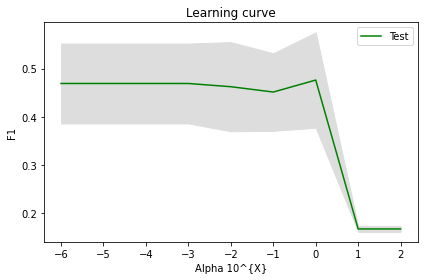

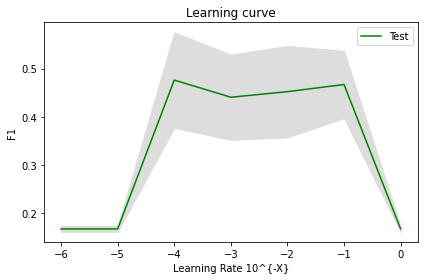

In [7]:
irex.train_model(True, False, True)

In [8]:
irex.save_model()

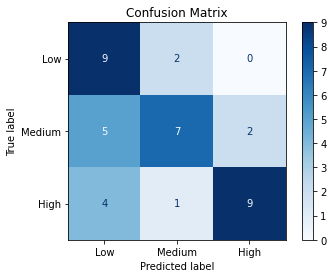

Classification accuracy = 64.1025641025641 %

              precision    recall  f1-score   support

           0       0.50      0.82      0.62        11
           1       0.70      0.50      0.58        14
           2       0.82      0.64      0.72        14

    accuracy                           0.64        39
   macro avg       0.67      0.65      0.64        39
weighted avg       0.69      0.64      0.64        39



In [9]:
irex.evaluate_model()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

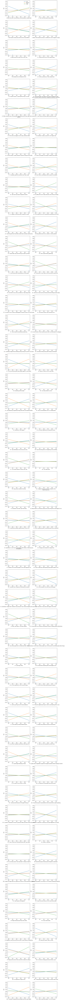

In [10]:
irex.run_ALE()

In [11]:
irex.apply_Threshold(0.01, -0.01)

In [12]:
irex.search_PAI(mode=1)

In [13]:
irex.run_LIME()

X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/1 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the 

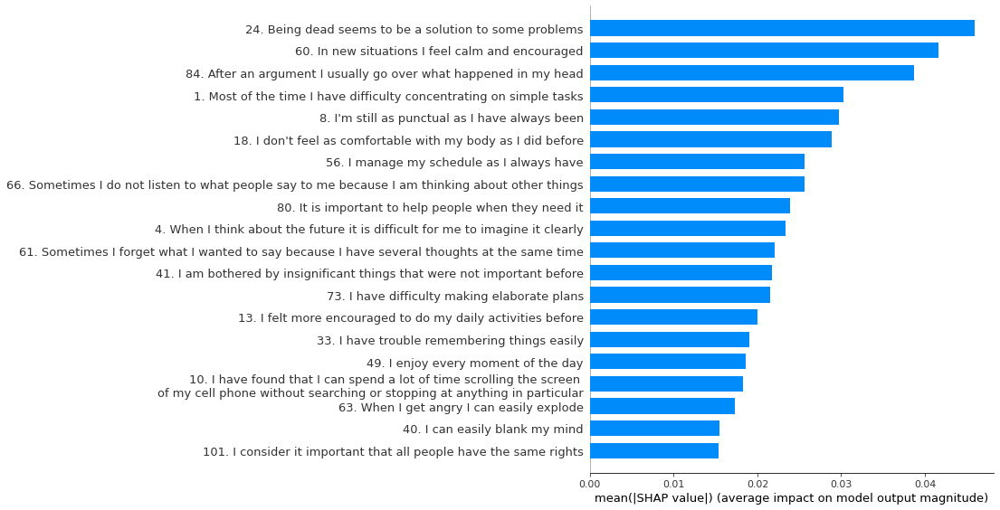

X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/1 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the 

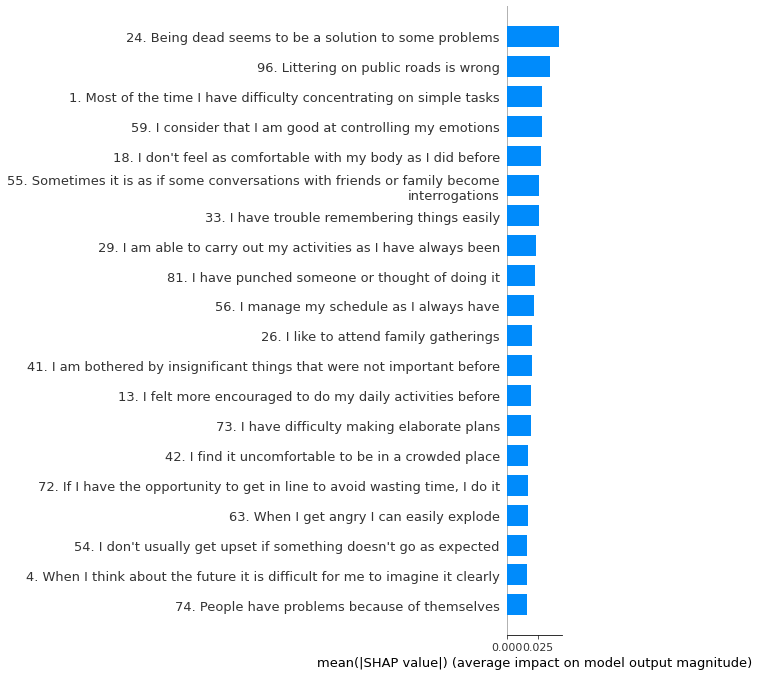

X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/1 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the 

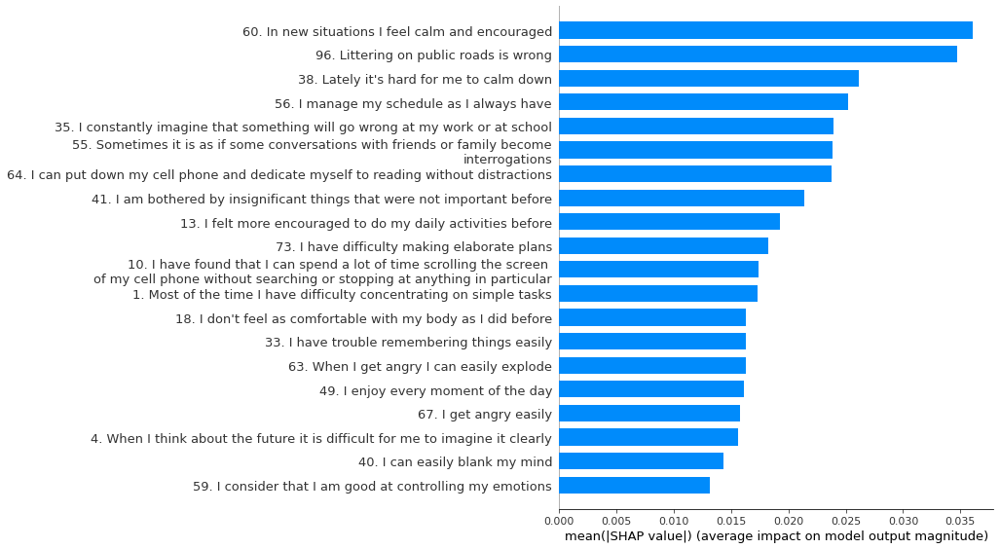

In [14]:
irex.run_SHAP()

In [15]:
irex.run_prepare_Heatmaps()

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Calculating permutation importances (if slow, try setting n_jobs parameter)...


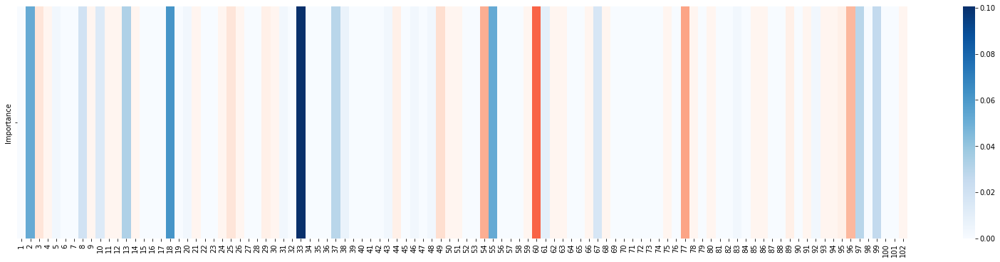

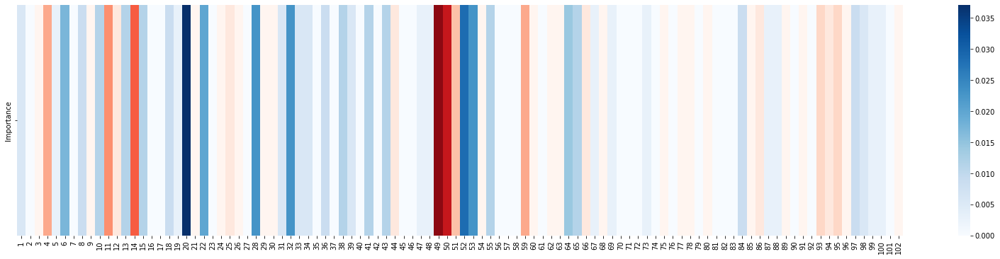

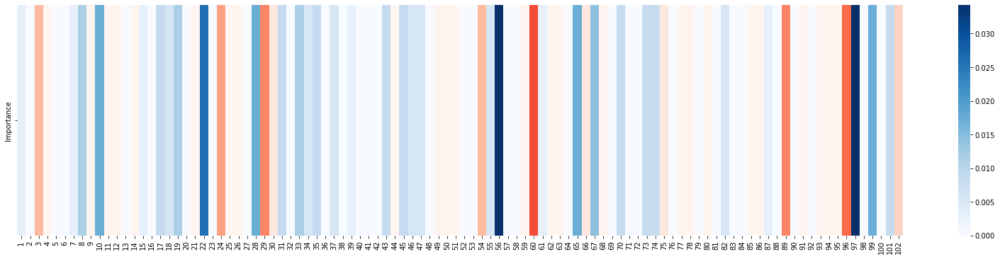

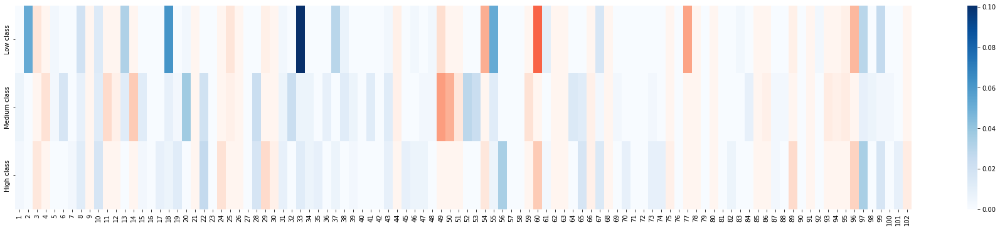

In [16]:
irex.run_Feature_Importance_Heatmap()

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Calculating shap values...


  0%|          | 0/39 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 


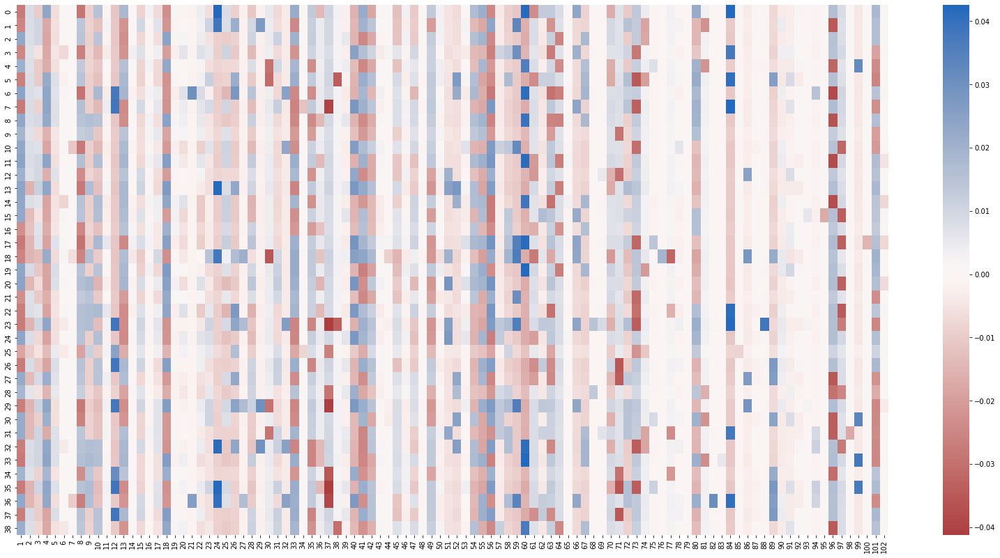

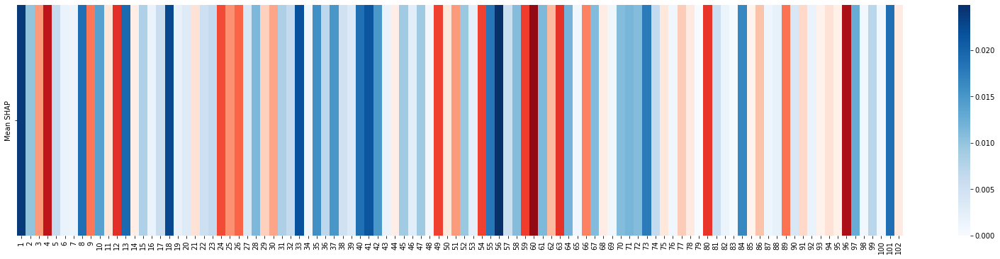

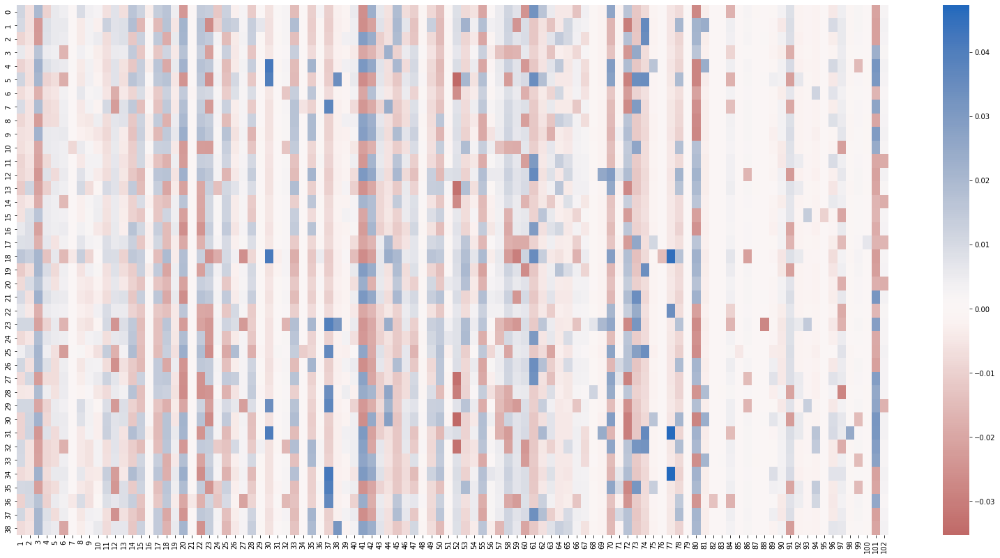

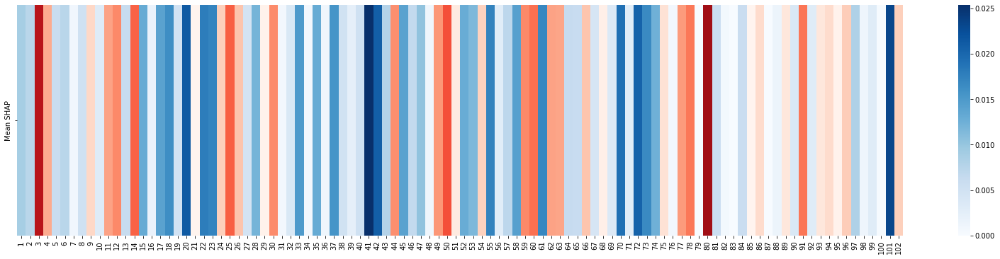

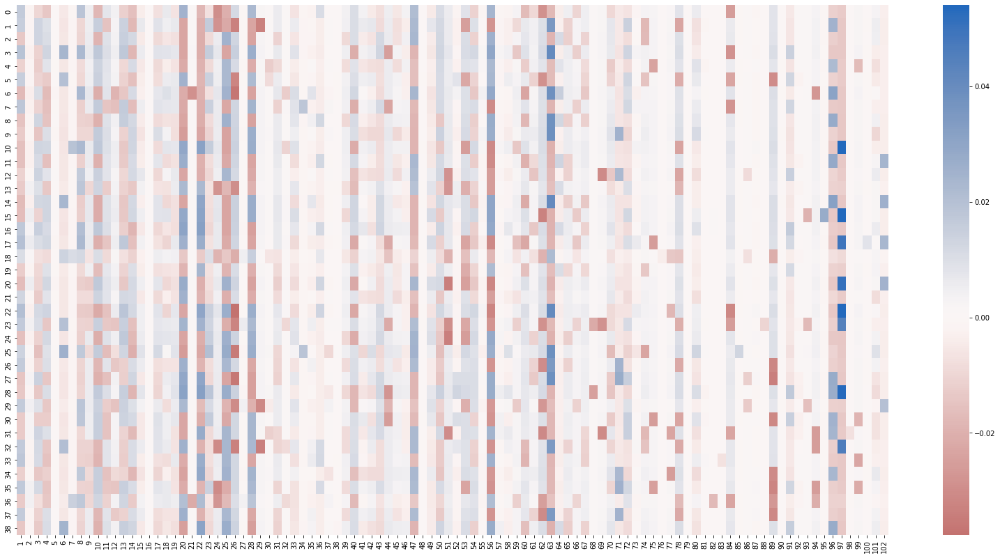

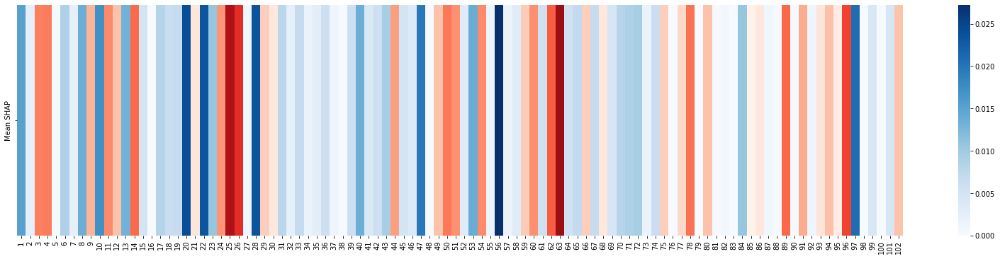

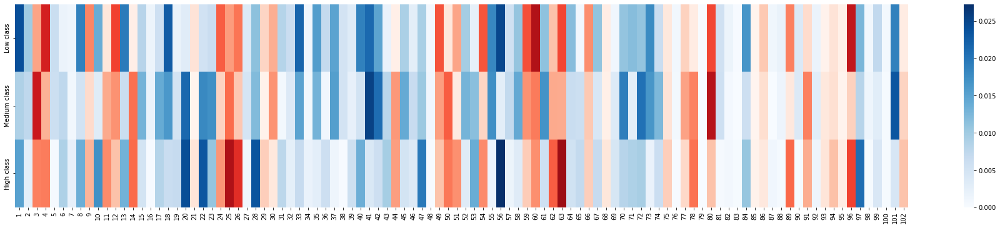

In [17]:
irex.run_SHAP_Heatmap()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

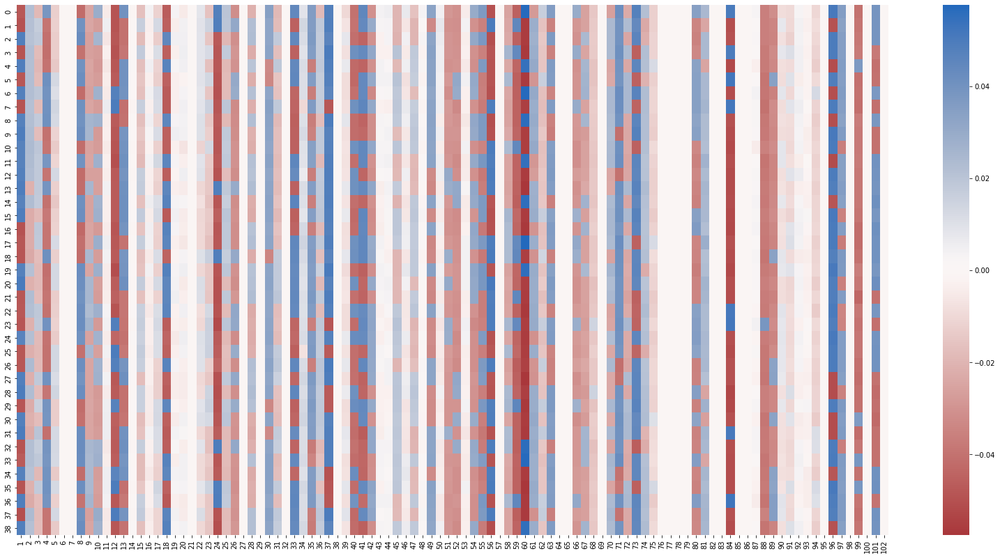

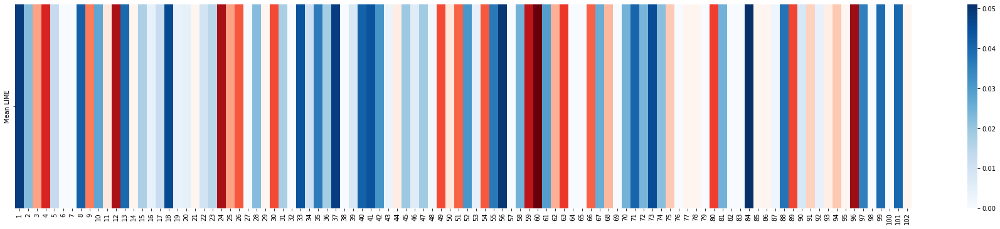

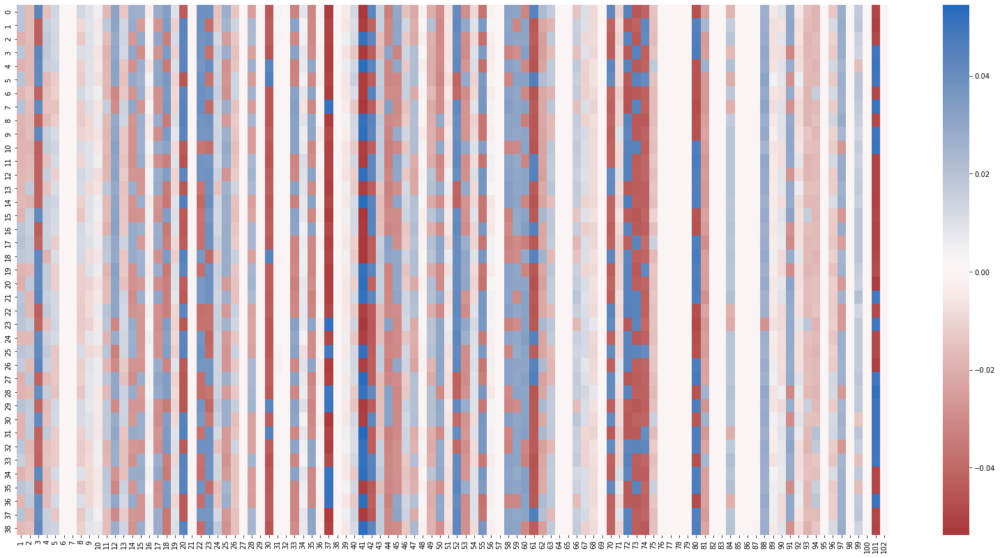

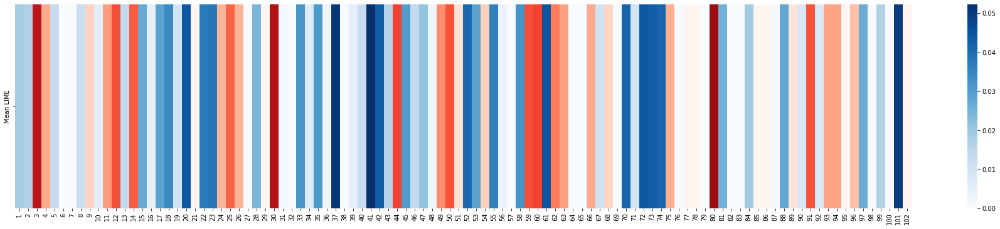

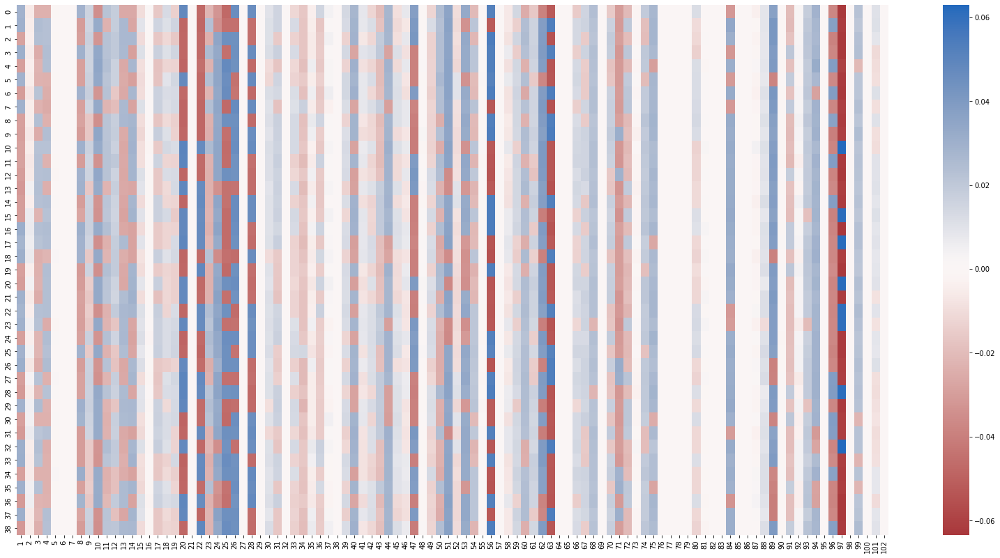

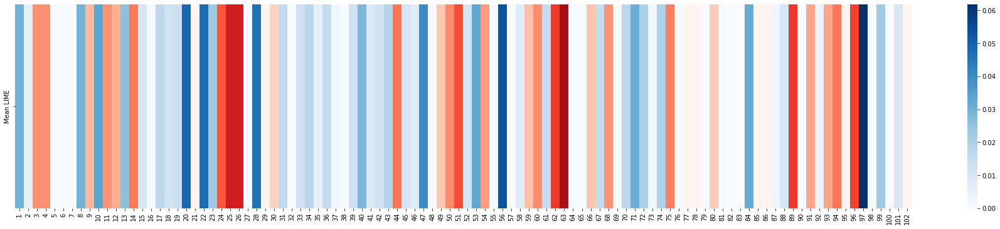

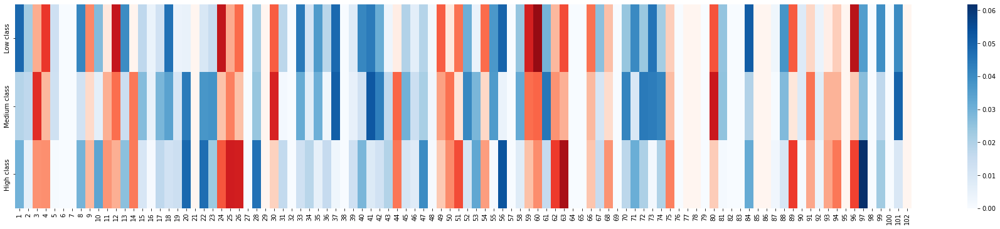

In [18]:
irex.run_LIME_Heatmap()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

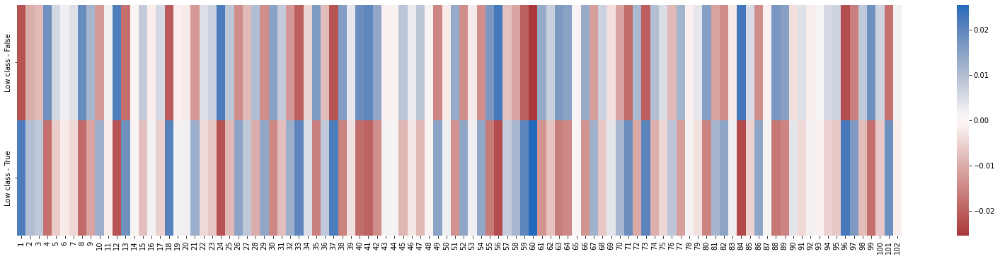

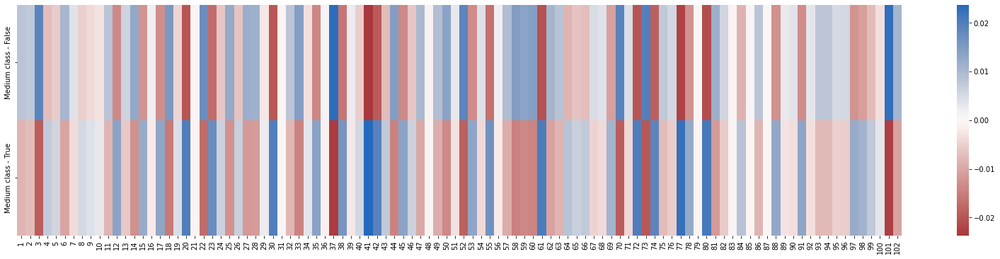

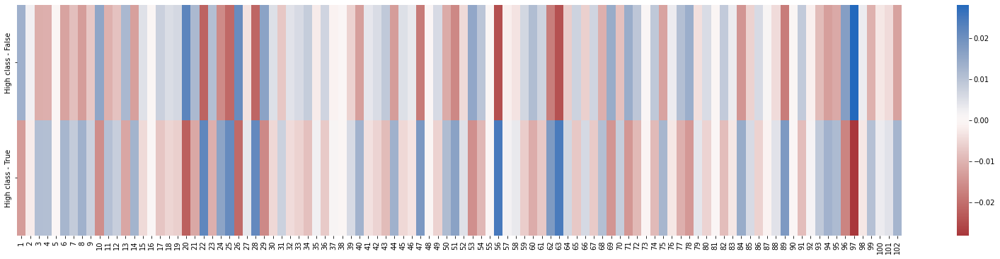

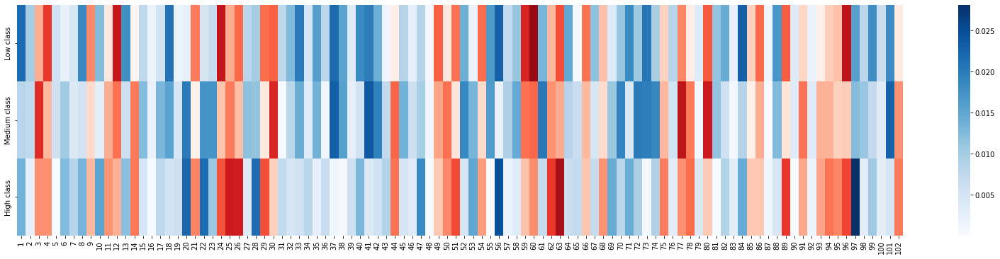

In [19]:
irex.run_ALE_Heatmap()

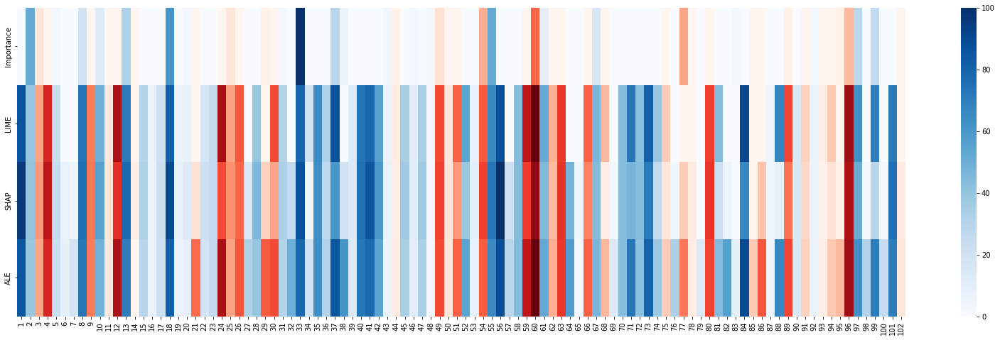

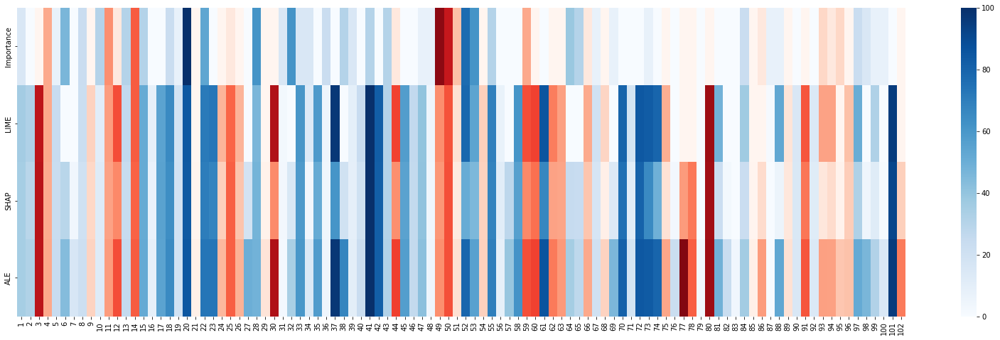

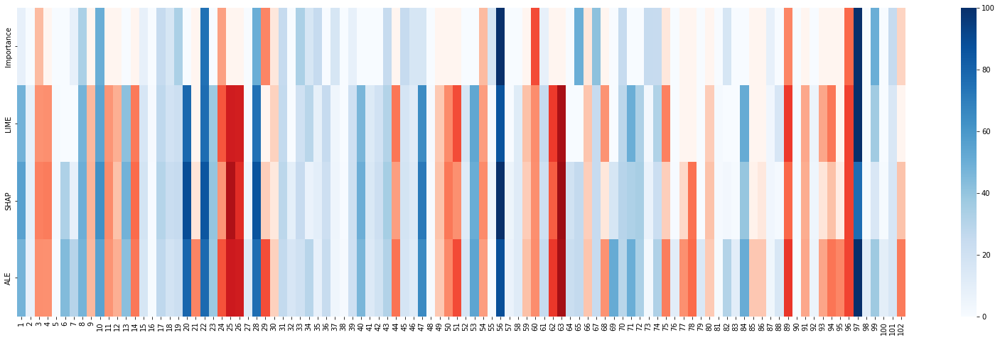

In [20]:
irex.run_Compare_Heatmaps()

In [21]:
irex.refine_dataset()

In [22]:
irex.iterate()

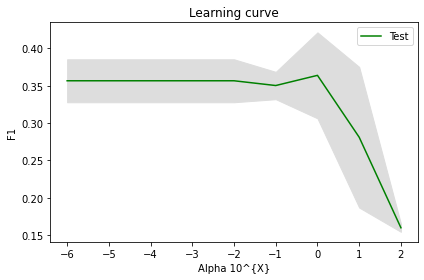

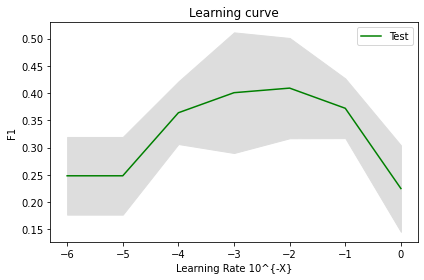

In [23]:
irex.train_model(True, True)

In [24]:
irex.save_model()

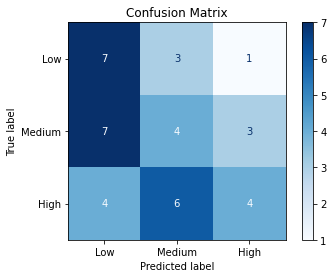

Classification accuracy = 38.46153846153847 %

              precision    recall  f1-score   support

           0       0.39      0.64      0.48        11
           1       0.31      0.29      0.30        14
           2       0.50      0.29      0.36        14

    accuracy                           0.38        39
   macro avg       0.40      0.40      0.38        39
weighted avg       0.40      0.38      0.37        39



In [25]:
irex.evaluate_model()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

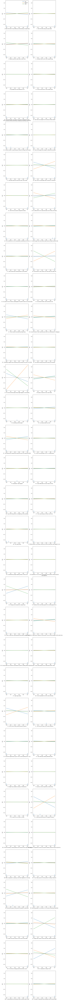

In [26]:
irex.run_ALE()

In [27]:
irex.apply_Threshold(0.01, -0.01)

In [28]:
irex.search_PAI(1)

In [29]:
irex.run_LIME()

X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/1 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the 

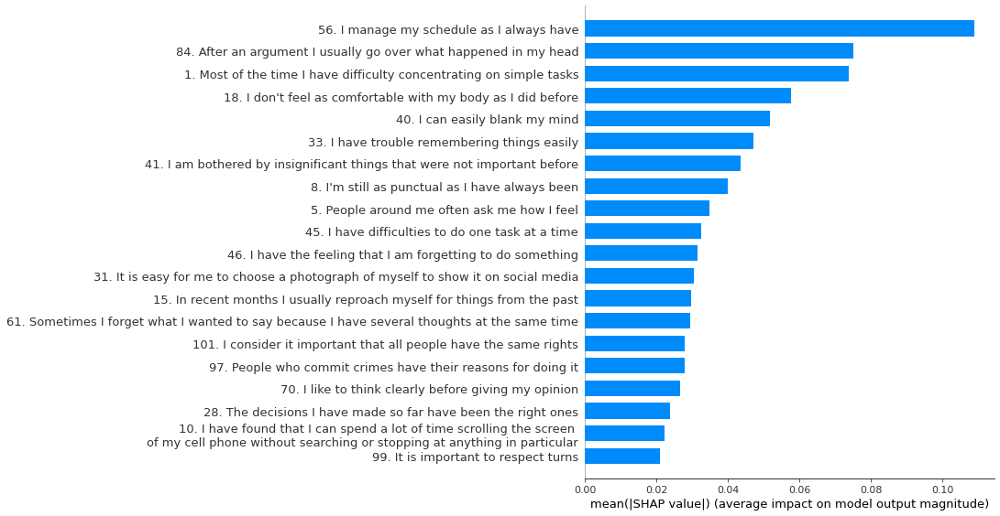

X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/1 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the 

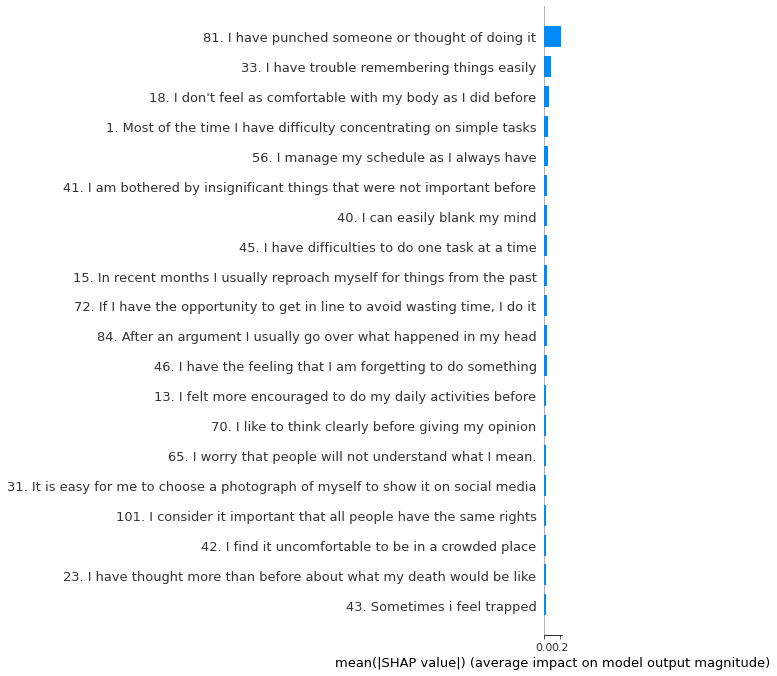

X does not have valid feature names, but MLPClassifier was fitted with feature names


  0%|          | 0/1 [00:00<?, ?it/s]

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the 

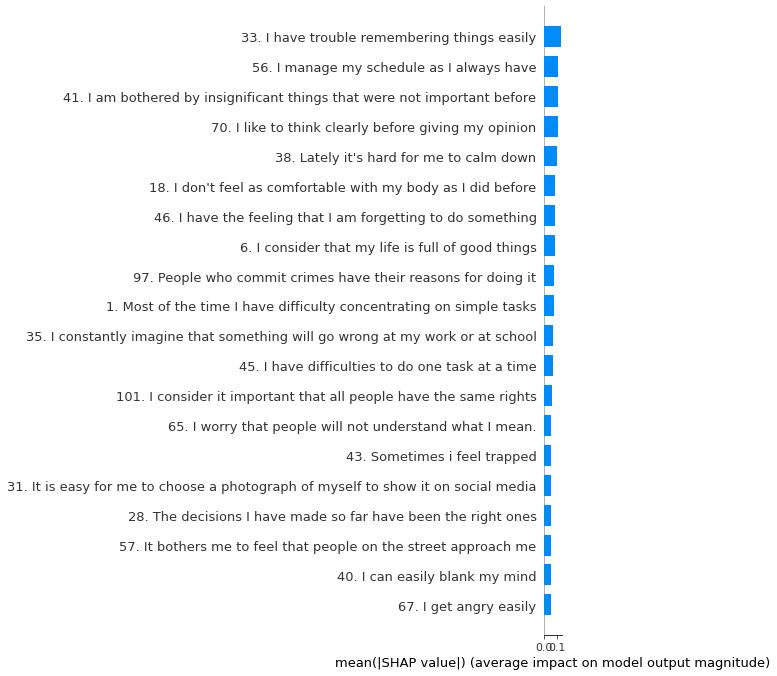

In [30]:
irex.run_SHAP()

In [31]:
irex.precompute_Heatmaps()

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Calculating permutation importances (if slow, try setting n_jobs parameter)...


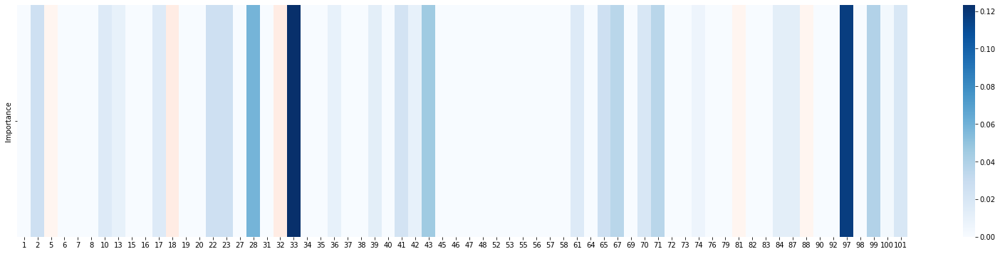

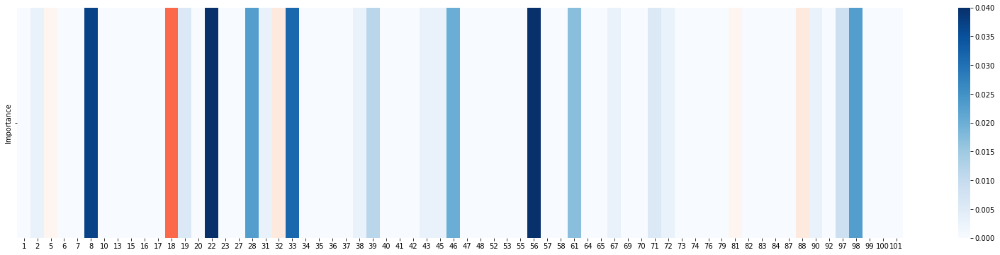

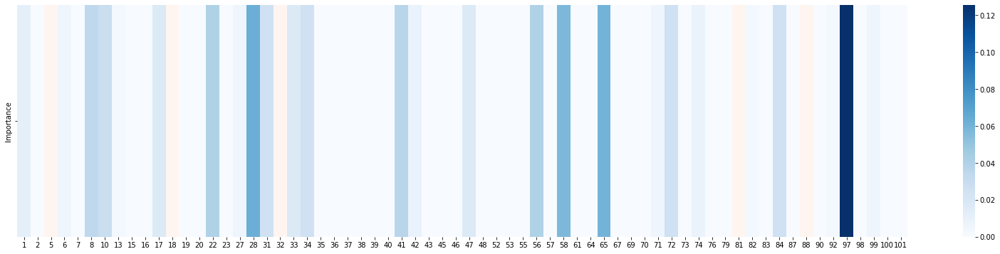

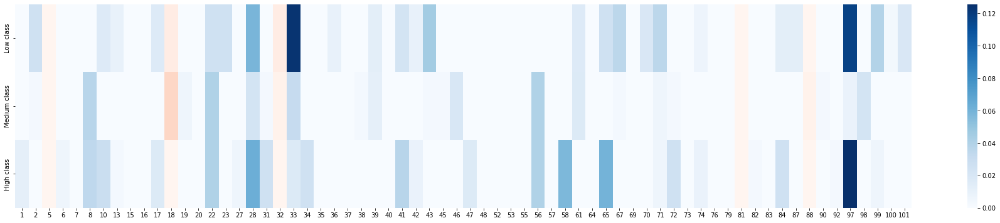

In [32]:
irex.run_Feature_Importance_Heatmap()

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Calculating shap values...


  0%|          | 0/39 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

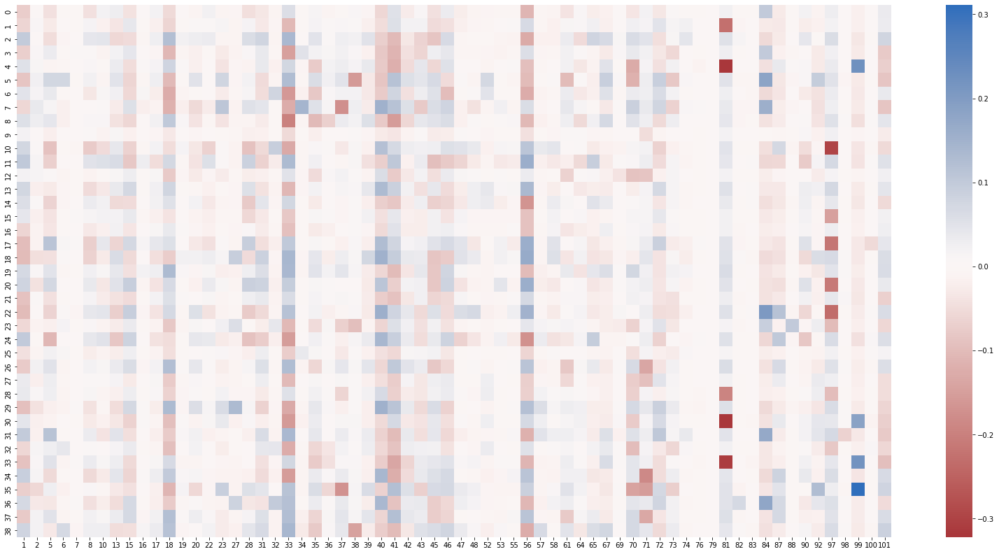

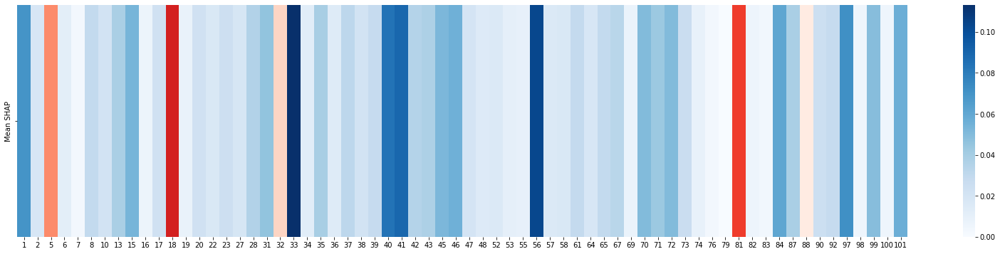

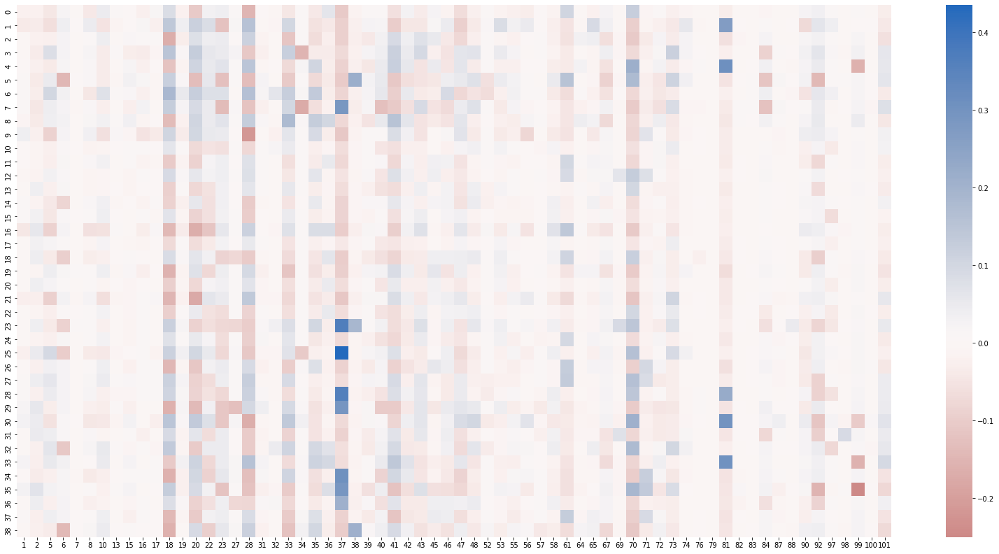

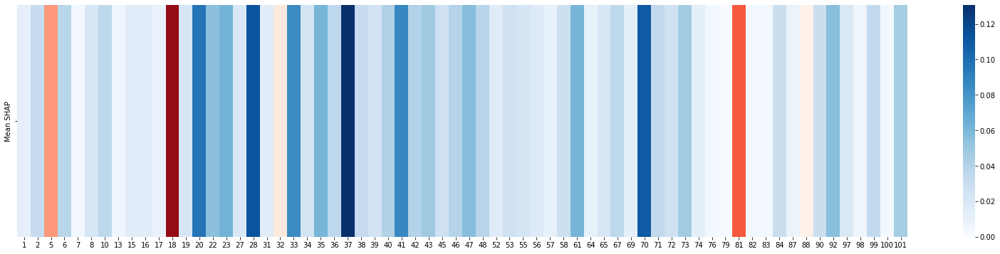

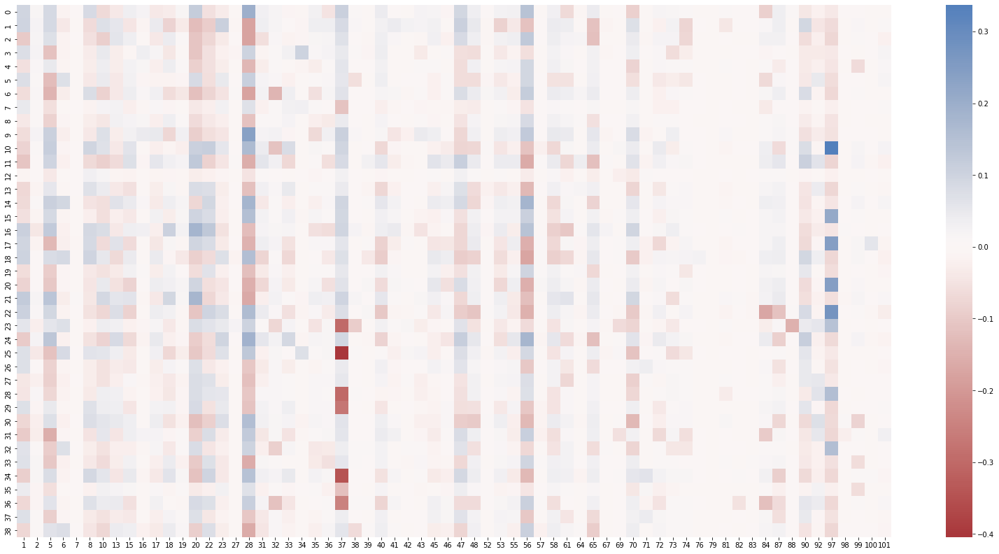

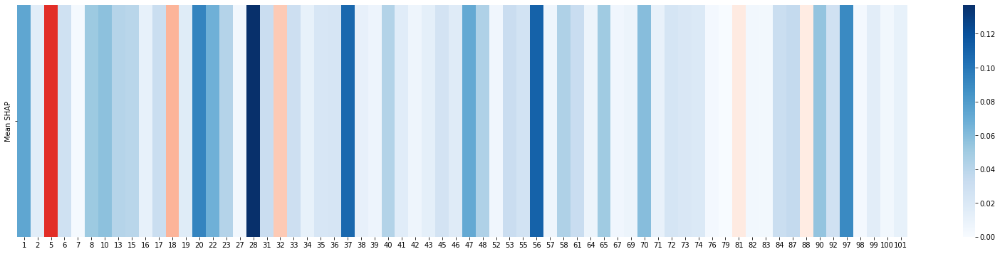

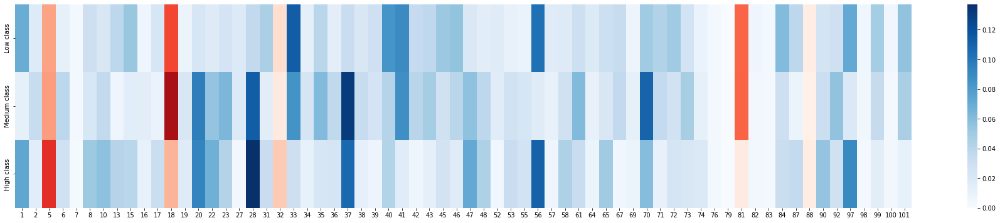

In [33]:
irex.run_SHAP_Heatmap()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

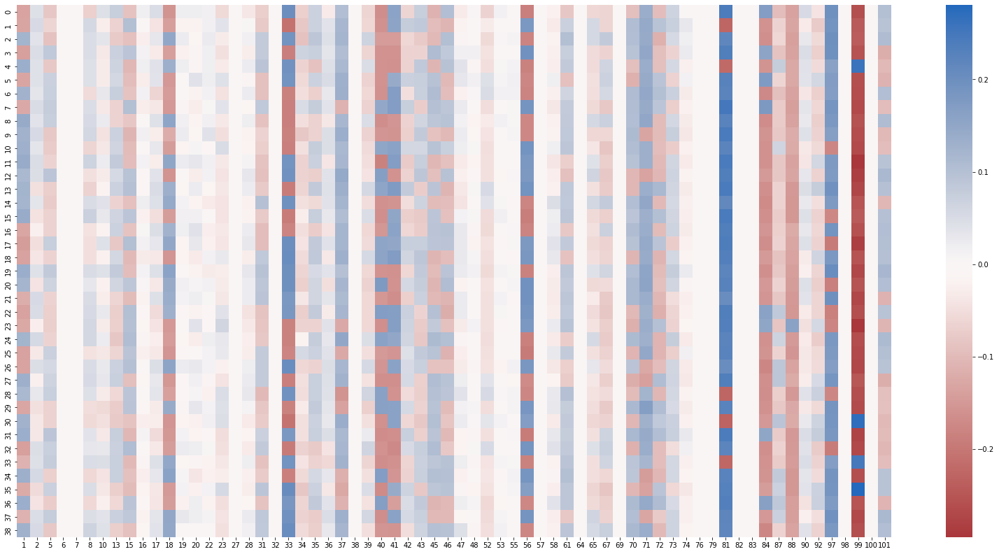

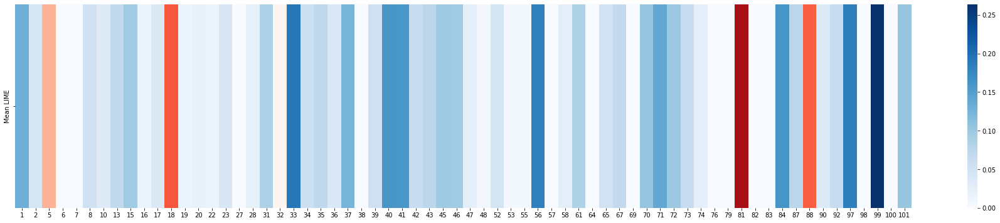

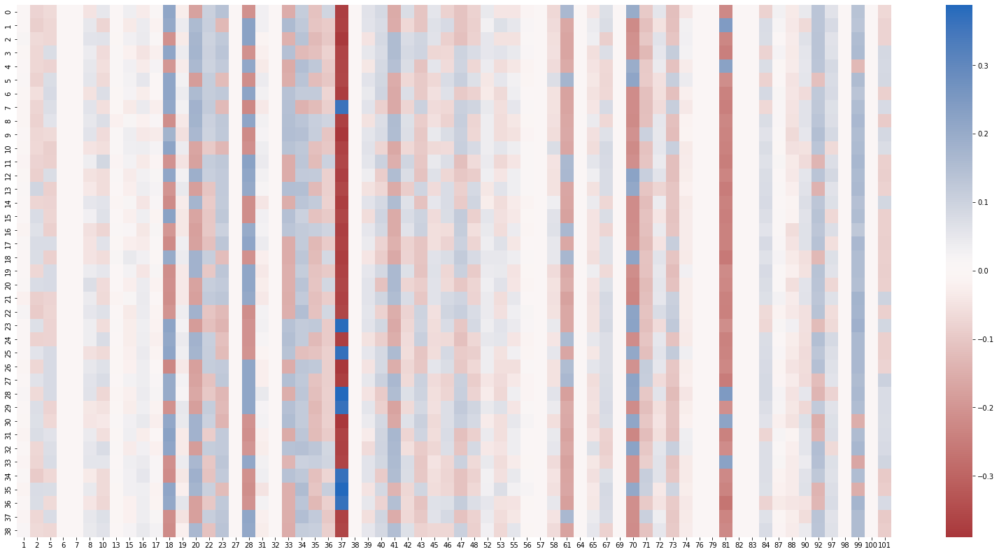

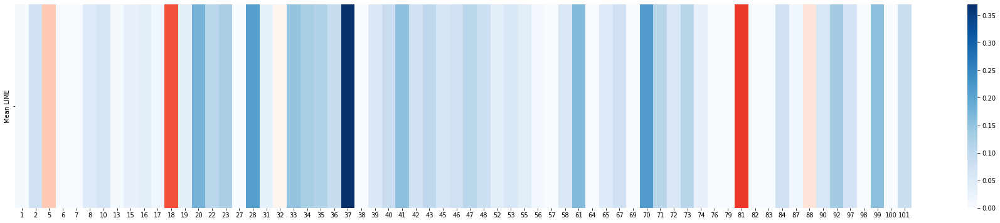

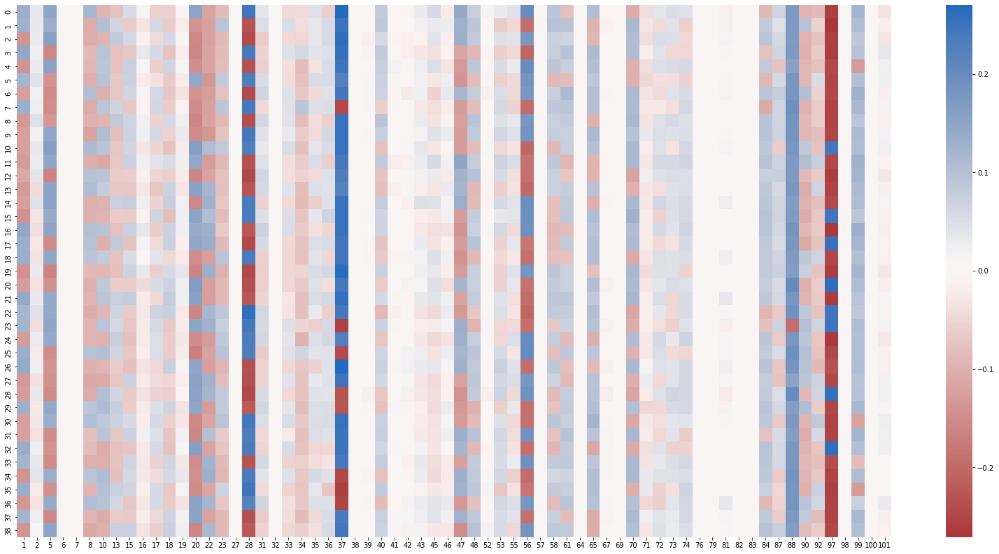

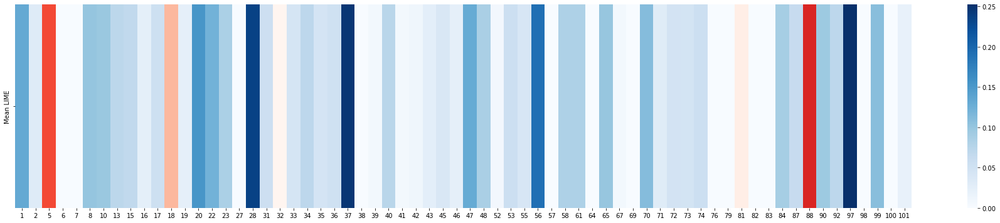

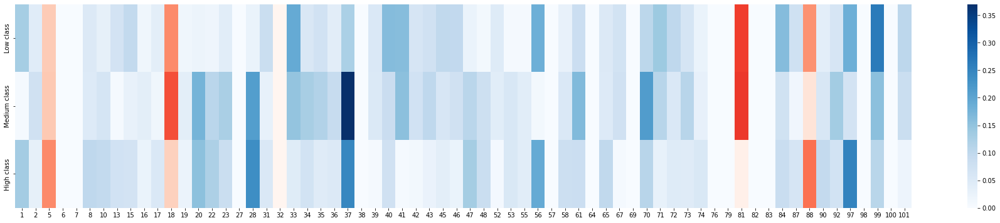

In [34]:
irex.run_LIME_Heatmap()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

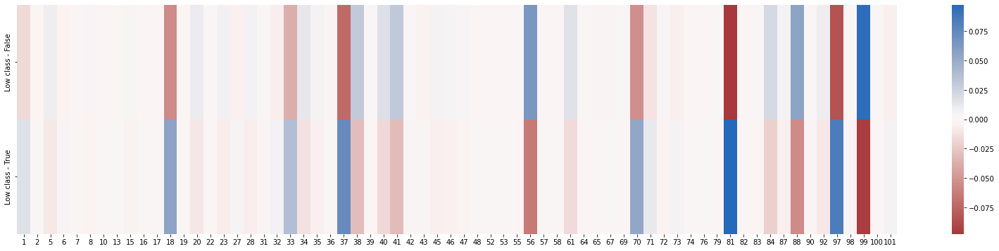

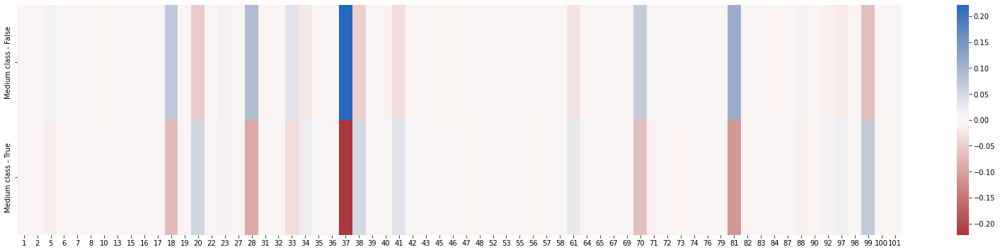

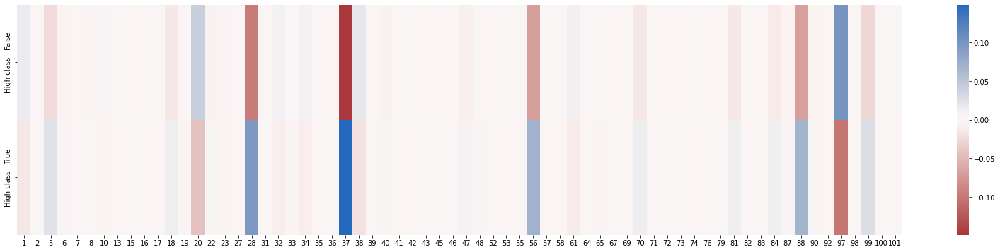

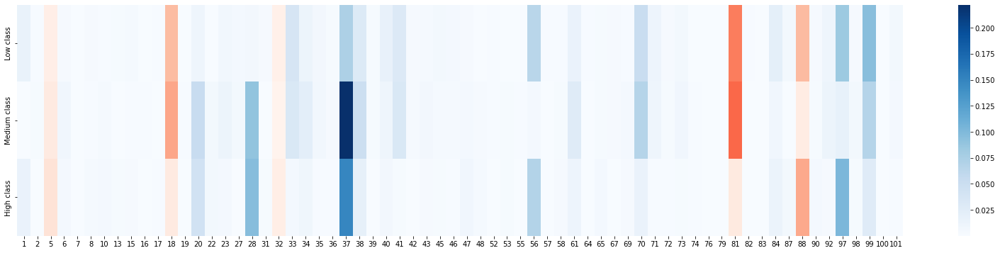

In [35]:
irex.run_ALE_Heatmap()

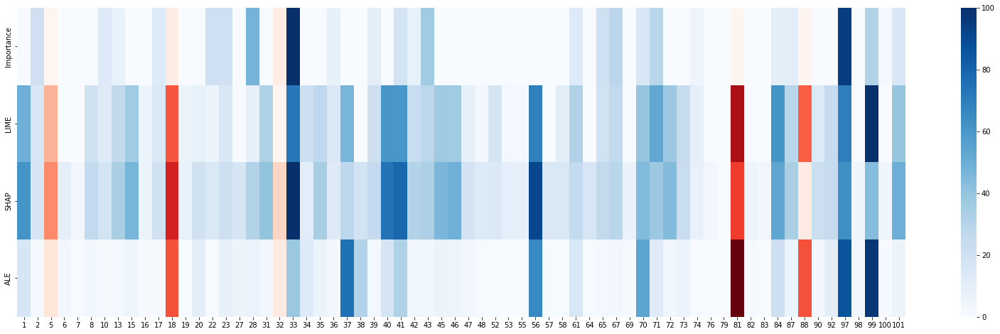

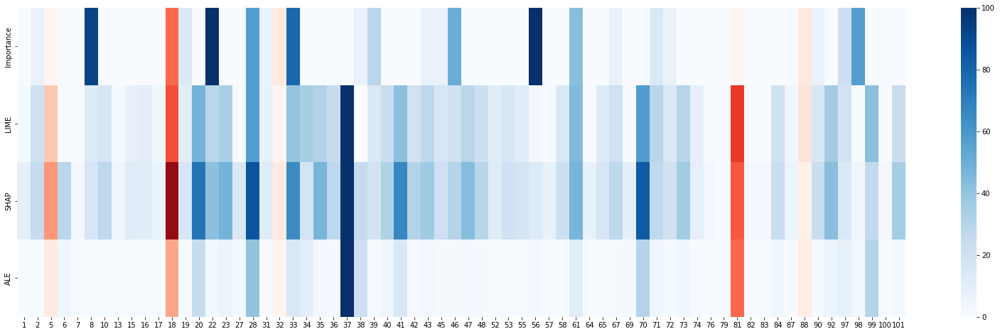

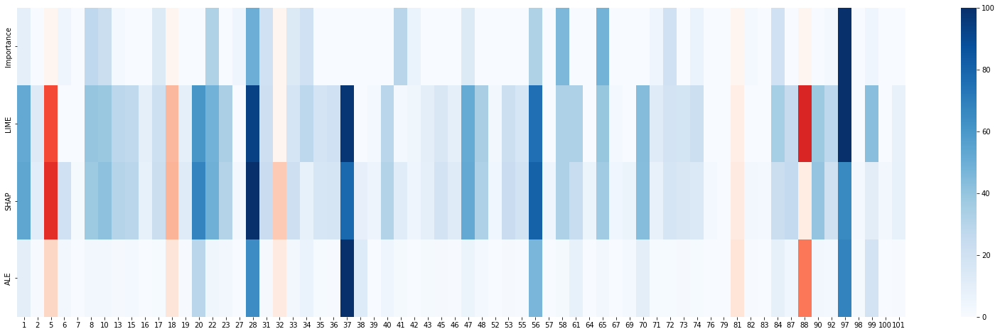

In [36]:
irex.run_Compare_Heatmaps()

In [37]:
irex.refine_dataset()

In [38]:
irex.prepare_data_for_ANN()

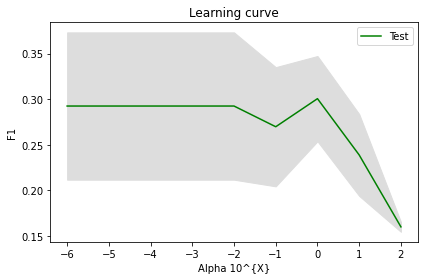

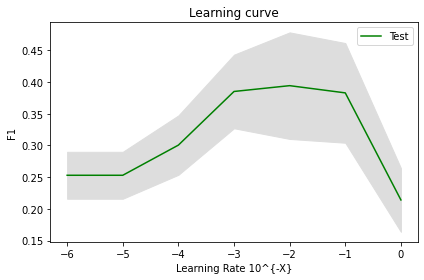

In [39]:
irex.train_model(True, True)

In [40]:
irex.save_model()

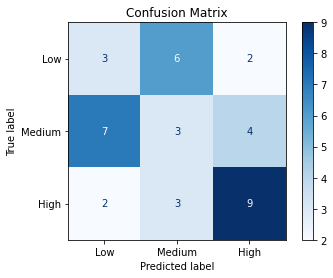

Classification accuracy = 38.46153846153847 %

              precision    recall  f1-score   support

           0       0.25      0.27      0.26        11
           1       0.25      0.21      0.23        14
           2       0.60      0.64      0.62        14

    accuracy                           0.38        39
   macro avg       0.37      0.38      0.37        39
weighted avg       0.38      0.38      0.38        39



In [41]:
irex.evaluate_model()

X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted with feature names
X does not have valid feature names, but MLPClassifier was fitted

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

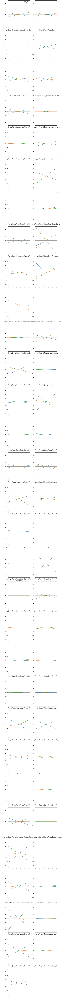

In [42]:
irex.run_ALE()

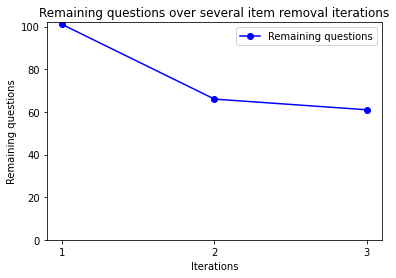

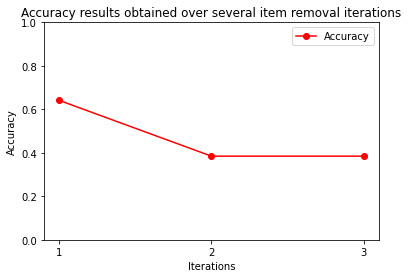

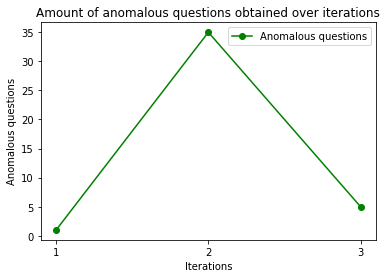

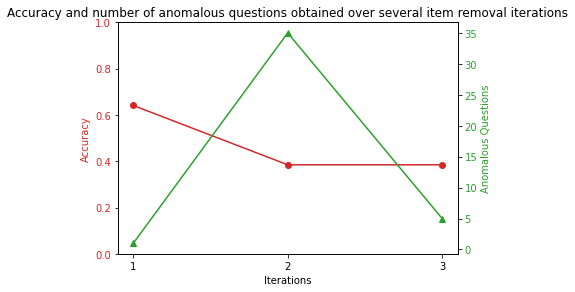

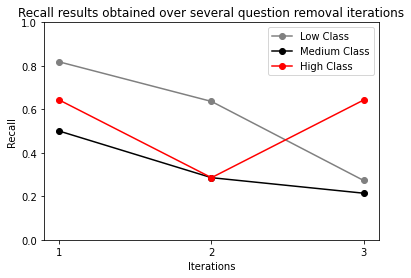

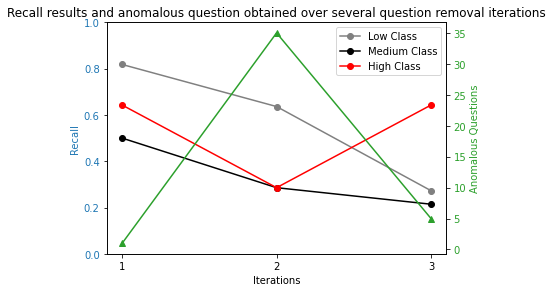

In [43]:
irex.plot_global_process()